In [9]:
import torch
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import random_split
from torchvision import transforms
from PIL import Image
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

In [10]:
import torch.nn as nn
import torch.nn.functional as F

In [11]:
class TomoDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.files = sorted(os.listdir(img_dir))
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.files[idx])
        mask_path = os.path.join(self.mask_dir, self.files[idx])

        image = Image.open(img_path).convert("L")   # grayscale
        mask = Image.open(mask_path).convert("L")   # binary mask

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        mask = (mask > 0.5).float()   # binarize
        return image, mask


In [12]:
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super().__init__()
        self.down1 = DoubleConv(n_channels, 16)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(16, 32)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = DoubleConv(32, 64)
        self.pool3 = nn.MaxPool2d(2)

        self.middle = DoubleConv(64, 128)

        self.up3 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv3 = DoubleConv(128, 64)
        self.up2 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.conv2 = DoubleConv(64, 32)
        self.up1 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.conv1 = DoubleConv(32, 16)

        self.outc = nn.Conv2d(16, n_classes, 1)

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(self.pool1(d1))
        d3 = self.down3(self.pool2(d2))
        m = self.middle(self.pool3(d3))

        u3 = self.up3(m)
        u3 = self.conv3(torch.cat([u3, d3], dim=1))
        u2 = self.up2(u3)
        u2 = self.conv2(torch.cat([u2, d2], dim=1))
        u1 = self.up1(u2)
        u1 = self.conv1(torch.cat([u1, d1], dim=1))
        return torch.sigmoid(self.outc(u1))

In [13]:
# Example transforms (resize for speed, normalize)
transform = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.ToTensor(),
])

In [14]:
train_dataset = TomoDataset("../joana/data/train_data/images_100", "../joana/data/train_data/masks_100", transform=transform)
#train_dataset = TomoDataset("/mnt/bgfs/projects/tomo_nano/joana/data/train_data/images_100", "/mnt/bgfs/projects/tomo_nano/joana/data/train_data/masks_100", transform=transform)

In [18]:
from torch.utils.data import Subset

train_dataset = Subset(train_dataset, list(range(1, len(train_dataset))))

In [19]:
val_ratio = 0.1
n_total = len(train_dataset)
n_val = int(n_total * val_ratio)
n_train = n_total - n_val

train_ds, val_ds = random_split(train_dataset, [n_train, n_val])

In [20]:
train_loader = DataLoader(train_ds, batch_size=4, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=4, shuffle=False)

print(f"Train: {len(train_ds)}, Val: {len(val_ds)}")

Train: 90, Val: 10


In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

In [22]:
n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

  1%|          | 1/100 [00:08<14:24,  8.73s/it]

Epoch 1/100 - Train Loss: 0.5351 - Val Loss: 0.6386


  2%|▏         | 2/100 [00:14<11:21,  6.95s/it]

Epoch 2/100 - Train Loss: 0.4423 - Val Loss: 0.4664


  3%|▎         | 3/100 [00:19<09:59,  6.18s/it]

Epoch 3/100 - Train Loss: 0.4023 - Val Loss: 0.3814


  4%|▍         | 4/100 [00:24<09:14,  5.77s/it]

Epoch 4/100 - Train Loss: 0.3805 - Val Loss: 0.3573


  5%|▌         | 5/100 [00:30<08:57,  5.66s/it]

Epoch 5/100 - Train Loss: 0.3680 - Val Loss: 0.3506


  6%|▌         | 6/100 [00:35<08:47,  5.61s/it]

Epoch 6/100 - Train Loss: 0.3590 - Val Loss: 0.3448


  7%|▋         | 7/100 [00:41<08:43,  5.63s/it]

Epoch 7/100 - Train Loss: 0.3501 - Val Loss: 0.3426


  8%|▊         | 8/100 [00:46<08:30,  5.55s/it]

Epoch 8/100 - Train Loss: 0.3431 - Val Loss: 0.3307


  9%|▉         | 9/100 [00:52<08:18,  5.47s/it]

Epoch 9/100 - Train Loss: 0.3358 - Val Loss: 0.3268


 10%|█         | 10/100 [00:57<08:06,  5.40s/it]

Epoch 10/100 - Train Loss: 0.3293 - Val Loss: 0.3242


 11%|█         | 11/100 [01:02<07:53,  5.32s/it]

Epoch 11/100 - Train Loss: 0.3241 - Val Loss: 0.3169


 12%|█▏        | 12/100 [01:08<07:57,  5.43s/it]

Epoch 12/100 - Train Loss: 0.3164 - Val Loss: 0.3145


 13%|█▎        | 13/100 [01:13<07:48,  5.38s/it]

Epoch 13/100 - Train Loss: 0.3106 - Val Loss: 0.3064


 14%|█▍        | 14/100 [01:18<07:43,  5.38s/it]

Epoch 14/100 - Train Loss: 0.3044 - Val Loss: 0.3147


 15%|█▌        | 15/100 [01:24<07:36,  5.37s/it]

Epoch 15/100 - Train Loss: 0.2987 - Val Loss: 0.3061


 16%|█▌        | 16/100 [01:29<07:38,  5.46s/it]

Epoch 16/100 - Train Loss: 0.2942 - Val Loss: 0.2887


 17%|█▋        | 17/100 [01:35<07:33,  5.46s/it]

Epoch 17/100 - Train Loss: 0.2879 - Val Loss: 0.2851


 18%|█▊        | 18/100 [01:40<07:25,  5.43s/it]

Epoch 18/100 - Train Loss: 0.2834 - Val Loss: 0.3127


 19%|█▉        | 19/100 [01:46<07:29,  5.55s/it]

Epoch 19/100 - Train Loss: 0.2756 - Val Loss: 0.2808


 20%|██        | 20/100 [01:52<07:23,  5.55s/it]

Epoch 20/100 - Train Loss: 0.2723 - Val Loss: 0.2765


 21%|██        | 21/100 [01:57<07:10,  5.45s/it]

Epoch 21/100 - Train Loss: 0.2657 - Val Loss: 0.2749


 22%|██▏       | 22/100 [02:02<07:01,  5.40s/it]

Epoch 22/100 - Train Loss: 0.2592 - Val Loss: 0.2744


 23%|██▎       | 23/100 [02:07<06:52,  5.36s/it]

Epoch 23/100 - Train Loss: 0.2547 - Val Loss: 0.2660


 24%|██▍       | 24/100 [02:13<06:48,  5.37s/it]

Epoch 24/100 - Train Loss: 0.2514 - Val Loss: 0.2666


 25%|██▌       | 25/100 [02:18<06:41,  5.35s/it]

Epoch 25/100 - Train Loss: 0.2505 - Val Loss: 0.2546


 26%|██▌       | 26/100 [02:23<06:32,  5.30s/it]

Epoch 26/100 - Train Loss: 0.2445 - Val Loss: 0.2510


 27%|██▋       | 27/100 [02:29<06:32,  5.37s/it]

Epoch 27/100 - Train Loss: 0.2394 - Val Loss: 0.2514


 28%|██▊       | 28/100 [02:34<06:25,  5.36s/it]

Epoch 28/100 - Train Loss: 0.2343 - Val Loss: 0.2465


 29%|██▉       | 29/100 [02:39<06:20,  5.35s/it]

Epoch 29/100 - Train Loss: 0.2317 - Val Loss: 0.2624


 30%|███       | 30/100 [02:45<06:11,  5.30s/it]

Epoch 30/100 - Train Loss: 0.2278 - Val Loss: 0.2388


 31%|███       | 31/100 [02:50<06:06,  5.31s/it]

Epoch 31/100 - Train Loss: 0.2218 - Val Loss: 0.2481


 32%|███▏      | 32/100 [02:55<06:00,  5.30s/it]

Epoch 32/100 - Train Loss: 0.2205 - Val Loss: 0.2374


 33%|███▎      | 33/100 [03:01<05:55,  5.30s/it]

Epoch 33/100 - Train Loss: 0.2178 - Val Loss: 0.2385


 34%|███▍      | 34/100 [03:06<05:52,  5.34s/it]

Epoch 34/100 - Train Loss: 0.2145 - Val Loss: 0.2365


 35%|███▌      | 35/100 [03:11<05:48,  5.36s/it]

Epoch 35/100 - Train Loss: 0.2090 - Val Loss: 0.2287


 36%|███▌      | 36/100 [03:17<05:43,  5.37s/it]

Epoch 36/100 - Train Loss: 0.2052 - Val Loss: 0.2238


 37%|███▋      | 37/100 [03:22<05:34,  5.31s/it]

Epoch 37/100 - Train Loss: 0.2027 - Val Loss: 0.2325


 38%|███▊      | 38/100 [03:27<05:30,  5.33s/it]

Epoch 38/100 - Train Loss: 0.2023 - Val Loss: 0.2312


 39%|███▉      | 39/100 [03:33<05:26,  5.35s/it]

Epoch 39/100 - Train Loss: 0.1987 - Val Loss: 0.2149


 40%|████      | 40/100 [03:38<05:18,  5.30s/it]

Epoch 40/100 - Train Loss: 0.1948 - Val Loss: 0.2098


 41%|████      | 41/100 [03:43<05:10,  5.27s/it]

Epoch 41/100 - Train Loss: 0.1905 - Val Loss: 0.2094


 42%|████▏     | 42/100 [03:48<05:04,  5.24s/it]

Epoch 42/100 - Train Loss: 0.1909 - Val Loss: 0.2112


 43%|████▎     | 43/100 [03:54<04:58,  5.23s/it]

Epoch 43/100 - Train Loss: 0.1881 - Val Loss: 0.2062


 44%|████▍     | 44/100 [03:59<04:52,  5.22s/it]

Epoch 44/100 - Train Loss: 0.1880 - Val Loss: 0.2028


 45%|████▌     | 45/100 [04:04<04:50,  5.29s/it]

Epoch 45/100 - Train Loss: 0.1812 - Val Loss: 0.2237


 46%|████▌     | 46/100 [04:09<04:44,  5.27s/it]

Epoch 46/100 - Train Loss: 0.1793 - Val Loss: 0.2017


 47%|████▋     | 47/100 [04:15<04:45,  5.38s/it]

Epoch 47/100 - Train Loss: 0.1793 - Val Loss: 0.1975


 48%|████▊     | 48/100 [04:20<04:38,  5.35s/it]

Epoch 48/100 - Train Loss: 0.1718 - Val Loss: 0.1934


 49%|████▉     | 49/100 [04:26<04:31,  5.31s/it]

Epoch 49/100 - Train Loss: 0.1692 - Val Loss: 0.2055


 50%|█████     | 50/100 [04:31<04:25,  5.32s/it]

Epoch 50/100 - Train Loss: 0.1692 - Val Loss: 0.1925


 51%|█████     | 51/100 [04:36<04:21,  5.35s/it]

Epoch 51/100 - Train Loss: 0.1647 - Val Loss: 0.1938


 52%|█████▏    | 52/100 [04:42<04:16,  5.35s/it]

Epoch 52/100 - Train Loss: 0.1623 - Val Loss: 0.2063


 53%|█████▎    | 53/100 [04:47<04:09,  5.31s/it]

Epoch 53/100 - Train Loss: 0.1711 - Val Loss: 0.1876


 54%|█████▍    | 54/100 [04:52<04:08,  5.39s/it]

Epoch 54/100 - Train Loss: 0.1648 - Val Loss: 0.1817


 55%|█████▌    | 55/100 [04:58<04:00,  5.34s/it]

Epoch 55/100 - Train Loss: 0.1566 - Val Loss: 0.1905


 56%|█████▌    | 56/100 [05:03<03:54,  5.34s/it]

Epoch 56/100 - Train Loss: 0.1548 - Val Loss: 0.1996


 57%|█████▋    | 57/100 [05:08<03:48,  5.31s/it]

Epoch 57/100 - Train Loss: 0.1554 - Val Loss: 0.1839


 58%|█████▊    | 58/100 [05:14<03:44,  5.33s/it]

Epoch 58/100 - Train Loss: 0.1496 - Val Loss: 0.1858


 59%|█████▉    | 59/100 [05:19<03:37,  5.31s/it]

Epoch 59/100 - Train Loss: 0.1495 - Val Loss: 0.1755


 60%|██████    | 60/100 [05:24<03:31,  5.28s/it]

Epoch 60/100 - Train Loss: 0.1502 - Val Loss: 0.1746


 61%|██████    | 61/100 [05:29<03:25,  5.28s/it]

Epoch 61/100 - Train Loss: 0.1450 - Val Loss: 0.1713


 62%|██████▏   | 62/100 [05:35<03:19,  5.25s/it]

Epoch 62/100 - Train Loss: 0.1444 - Val Loss: 0.1821


 63%|██████▎   | 63/100 [05:40<03:16,  5.32s/it]

Epoch 63/100 - Train Loss: 0.1462 - Val Loss: 0.1889


 64%|██████▍   | 64/100 [05:45<03:10,  5.31s/it]

Epoch 64/100 - Train Loss: 0.1426 - Val Loss: 0.1719


 65%|██████▌   | 65/100 [05:51<03:05,  5.29s/it]

Epoch 65/100 - Train Loss: 0.1420 - Val Loss: 0.1685


 66%|██████▌   | 66/100 [05:56<02:59,  5.27s/it]

Epoch 66/100 - Train Loss: 0.1382 - Val Loss: 0.1672


 67%|██████▋   | 67/100 [06:01<02:53,  5.25s/it]

Epoch 67/100 - Train Loss: 0.1386 - Val Loss: 0.1715


 68%|██████▊   | 68/100 [06:06<02:48,  5.27s/it]

Epoch 68/100 - Train Loss: 0.1389 - Val Loss: 0.1652


 69%|██████▉   | 69/100 [06:12<02:43,  5.26s/it]

Epoch 69/100 - Train Loss: 0.1333 - Val Loss: 0.1684


 70%|███████   | 70/100 [06:17<02:38,  5.28s/it]

Epoch 70/100 - Train Loss: 0.1291 - Val Loss: 0.1755


 71%|███████   | 71/100 [06:22<02:33,  5.28s/it]

Epoch 71/100 - Train Loss: 0.1288 - Val Loss: 0.1624


 72%|███████▏  | 72/100 [06:27<02:27,  5.27s/it]

Epoch 72/100 - Train Loss: 0.1308 - Val Loss: 0.1789


 73%|███████▎  | 73/100 [06:33<02:22,  5.26s/it]

Epoch 73/100 - Train Loss: 0.1306 - Val Loss: 0.2233


 74%|███████▍  | 74/100 [06:38<02:16,  5.25s/it]

Epoch 74/100 - Train Loss: 0.1287 - Val Loss: 0.1584


 75%|███████▌  | 75/100 [06:43<02:11,  5.24s/it]

Epoch 75/100 - Train Loss: 0.1296 - Val Loss: 0.1779


 76%|███████▌  | 76/100 [06:48<02:05,  5.23s/it]

Epoch 76/100 - Train Loss: 0.1250 - Val Loss: 0.1566


 77%|███████▋  | 77/100 [06:54<02:00,  5.24s/it]

Epoch 77/100 - Train Loss: 0.1242 - Val Loss: 0.1819


 78%|███████▊  | 78/100 [06:59<01:55,  5.27s/it]

Epoch 78/100 - Train Loss: 0.1304 - Val Loss: 0.1592


 79%|███████▉  | 79/100 [07:04<01:50,  5.25s/it]

Epoch 79/100 - Train Loss: 0.1185 - Val Loss: 0.1539


 80%|████████  | 80/100 [07:09<01:45,  5.28s/it]

Epoch 80/100 - Train Loss: 0.1168 - Val Loss: 0.1559


 81%|████████  | 81/100 [07:15<01:41,  5.33s/it]

Epoch 81/100 - Train Loss: 0.1197 - Val Loss: 0.1653


 82%|████████▏ | 82/100 [07:20<01:35,  5.31s/it]

Epoch 82/100 - Train Loss: 0.1211 - Val Loss: 0.1584


 83%|████████▎ | 83/100 [07:25<01:30,  5.32s/it]

Epoch 83/100 - Train Loss: 0.1117 - Val Loss: 0.1563


 84%|████████▍ | 84/100 [07:31<01:25,  5.33s/it]

Epoch 84/100 - Train Loss: 0.1111 - Val Loss: 0.1514


 85%|████████▌ | 85/100 [07:36<01:19,  5.30s/it]

Epoch 85/100 - Train Loss: 0.1115 - Val Loss: 0.1527


 86%|████████▌ | 86/100 [07:41<01:13,  5.28s/it]

Epoch 86/100 - Train Loss: 0.1082 - Val Loss: 0.1505


 87%|████████▋ | 87/100 [07:47<01:08,  5.27s/it]

Epoch 87/100 - Train Loss: 0.1061 - Val Loss: 0.1500


 88%|████████▊ | 88/100 [07:52<01:03,  5.26s/it]

Epoch 88/100 - Train Loss: 0.1065 - Val Loss: 0.1468


 89%|████████▉ | 89/100 [07:57<00:57,  5.24s/it]

Epoch 89/100 - Train Loss: 0.1101 - Val Loss: 0.1492


 90%|█████████ | 90/100 [08:02<00:52,  5.23s/it]

Epoch 90/100 - Train Loss: 0.1086 - Val Loss: 0.1521


 91%|█████████ | 91/100 [08:07<00:46,  5.22s/it]

Epoch 91/100 - Train Loss: 0.0993 - Val Loss: 0.1446


 92%|█████████▏| 92/100 [08:13<00:41,  5.21s/it]

Epoch 92/100 - Train Loss: 0.1034 - Val Loss: 0.1465


 93%|█████████▎| 93/100 [08:18<00:36,  5.22s/it]

Epoch 93/100 - Train Loss: 0.0979 - Val Loss: 0.1473


 94%|█████████▍| 94/100 [08:23<00:31,  5.23s/it]

Epoch 94/100 - Train Loss: 0.0970 - Val Loss: 0.1501


 95%|█████████▌| 95/100 [08:28<00:26,  5.23s/it]

Epoch 95/100 - Train Loss: 0.1023 - Val Loss: 0.1485


 96%|█████████▌| 96/100 [08:33<00:20,  5.22s/it]

Epoch 96/100 - Train Loss: 0.0985 - Val Loss: 0.1459


 97%|█████████▋| 97/100 [08:39<00:15,  5.24s/it]

Epoch 97/100 - Train Loss: 0.0950 - Val Loss: 0.1549


 98%|█████████▊| 98/100 [08:44<00:10,  5.23s/it]

Epoch 98/100 - Train Loss: 0.0952 - Val Loss: 0.1505


 99%|█████████▉| 99/100 [08:49<00:05,  5.23s/it]

Epoch 99/100 - Train Loss: 0.0958 - Val Loss: 0.1505


100%|██████████| 100/100 [08:54<00:00,  5.35s/it]

Epoch 100/100 - Train Loss: 0.0930 - Val Loss: 0.1418


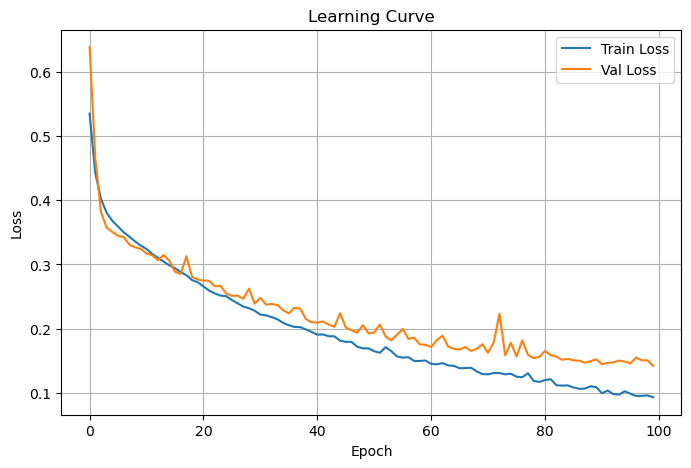

In [23]:
plt.figure(figsize=(8,5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Learning Curve")
plt.legend()
plt.grid(True)
plt.show()

In [24]:
model.eval()
with torch.no_grad():
    imgs, masks = next(iter(train_loader))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

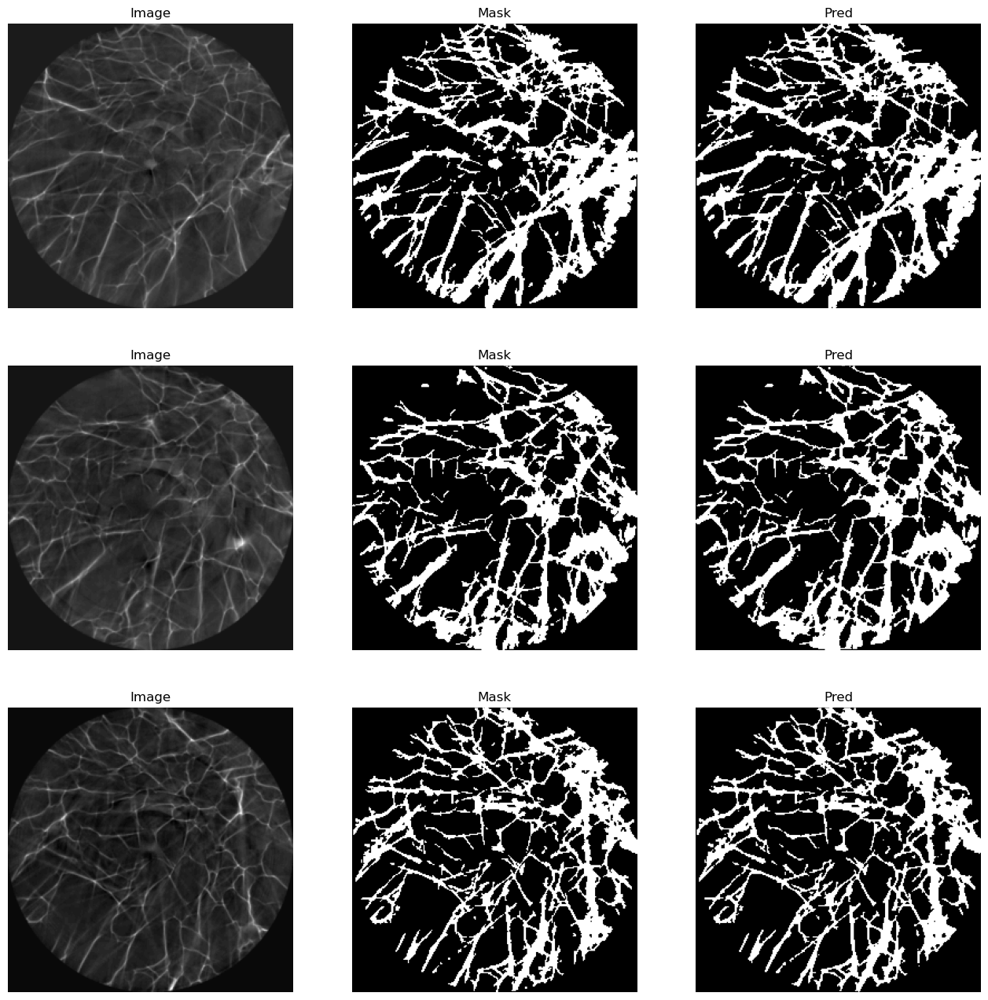

In [25]:
fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste01.png", bbox_inches='tight', dpi = 300)
plt.show()

# MÉTRICAS FOREGROUND FRACTION E COMPONENT COUNT PARA AS PREDIÇÕES DA REDE

In [26]:
import pandas as pd
import numpy as np
from skimage.measure import label, regionprops

def summarize_mask(mask):
    # mask: tensor ou array
    mask = mask.squeeze().numpy() if not isinstance(mask, np.ndarray) else mask
    vf = mask.sum() / mask.size  # foreground fraction
    ncc = label(mask).max()      # component count
    return vf, ncc

records = []

model.eval()
with torch.no_grad():
    for i, (imgs, masks) in enumerate(val_loader):
        imgs = imgs.to(device)
        preds = (model(imgs) > 0.5).float().cpu()
        for j in range(preds.shape[0]):
            mask_pred = preds[j, 0]  
            vf, ncc = summarize_mask(mask_pred)
            records.append({
                "batch": i,
                "slice": i * val_loader.batch_size + j,
                "method": "UNet",
                "vf": vf,
                "ncc": ncc
            })

df_unet_otsu = pd.DataFrame(records)
df_unet_otsu.head()

,batch,slice,method,vf,ncc
0,0,0,UNet,0.245605,69
1,0,1,UNet,0.275833,80
2,0,2,UNet,0.316467,62
3,0,3,UNet,0.239792,96
4,1,4,UNet,0.228241,62


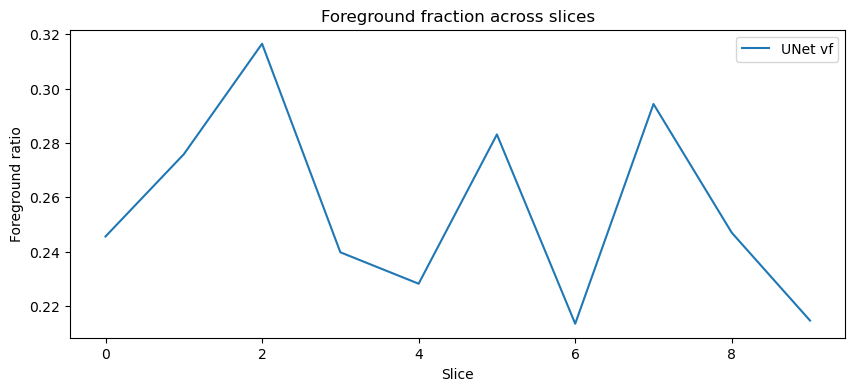

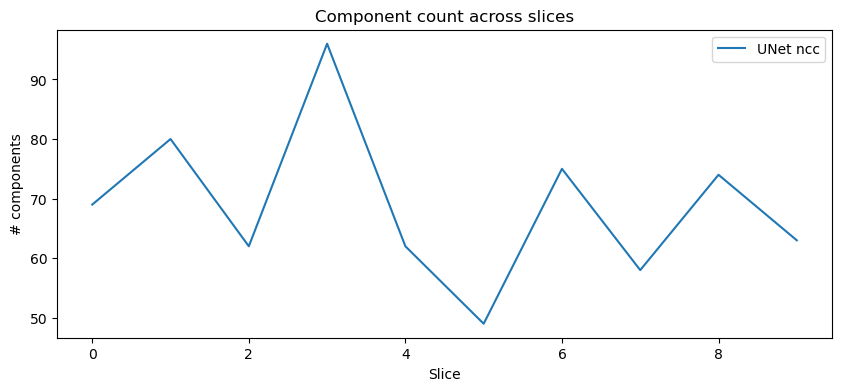

Potential outliers (|z|>3):


,batch,slice,method,vf,ncc,vf_z


In [28]:
# Plot per-method distributions
plt.figure(figsize=(10,4))
for m in df_unet_otsu["method"].unique():
    d = df_unet_otsu[df_unet_otsu["method"] == m]
    plt.plot(d["slice"], d["vf"], label=f"{m} vf")
plt.title("Foreground fraction across slices")
plt.xlabel("Slice"); plt.ylabel("Foreground ratio"); plt.legend(); plt.show()

plt.figure(figsize=(10,4))
for m in df_unet_otsu["method"].unique():
    d = df_unet_otsu[df_unet_otsu["method"] == m]
    plt.plot(d["slice"], d["ncc"], label=f"{m} ncc")
plt.title("Component count across slices")
plt.xlabel("Slice"); plt.ylabel("# components"); plt.legend(); plt.show()

fig.savefig("foreground fraction.png", bbox_inches='tight', dpi = 300)


# Flag outliers by z-score on vf per method
def zscore(x): 
    return (x - x.mean()) / (x.std() + 1e-8)

df_unet_otsu["vf_z"] = df_unet_otsu.groupby("method")["vf"].transform(zscore)
outliers = df_unet_otsu[np.abs(df_unet_otsu["vf_z"]) > 2]
print("Potential outliers (|z|>3):")
outliers.head(10)

In [29]:
records_gt = []

with torch.no_grad():
    for i, (imgs, masks) in enumerate(val_loader):
        for j in range(masks.shape[0]):
            mask_gt = masks[j, 0].cpu() 
            vf, ncc = summarize_mask(mask_gt)
            records_gt.append({
                "batch": i,
                "slice": i * val_loader.batch_size + j,
                "method": "GroundTruth",
                "vf": vf,
                "ncc": ncc
            })

df_gt = pd.DataFrame(records_gt)
df_gt.head()

,batch,slice,method,vf,ncc
0,0,0,GroundTruth,0.322571,51
1,0,1,GroundTruth,0.238495,48
2,0,2,GroundTruth,0.389923,32
3,0,3,GroundTruth,0.314590,47
4,1,4,GroundTruth,0.182800,51


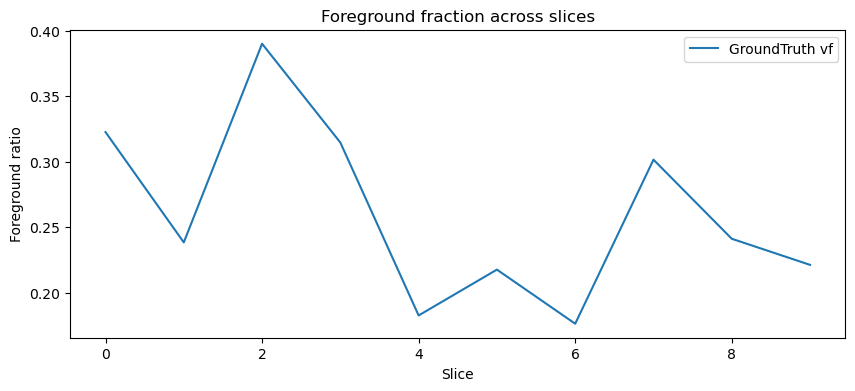

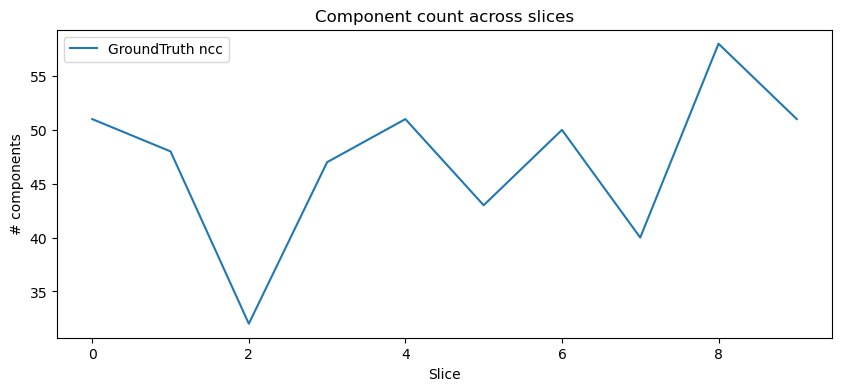

Potential outliers (|z|>3):


,batch,slice,method,vf,ncc,vf_z


In [30]:
# Plot per-method distributions
plt.figure(figsize=(10,4))
for m in df_gt["method"].unique():
    d = df_gt[df_gt["method"] == m]
    plt.plot(d["slice"], d["vf"], label=f"{m} vf")
plt.title("Foreground fraction across slices")
plt.xlabel("Slice"); plt.ylabel("Foreground ratio"); plt.legend(); plt.show()

plt.figure(figsize=(10,4))
for m in df_gt["method"].unique():
    d = df_gt[df_gt["method"] == m]
    plt.plot(d["slice"], d["ncc"], label=f"{m} ncc")
plt.title("Component count across slices")
plt.xlabel("Slice"); plt.ylabel("# components"); plt.legend(); plt.show()

fig.savefig("foreground fraction.png", bbox_inches='tight', dpi = 300)


# Flag outliers by z-score on vf per method
def zscore(x): 
    return (x - x.mean()) / (x.std() + 1e-8)

df_gt["vf_z"] = df_gt.groupby("method")["vf"].transform(zscore)
outliers = df_gt[np.abs(df_gt["vf_z"]) > 2]
print("Potential outliers (|z|>3):")
outliers.head(10)

In [31]:
df_gt.to_csv("df_gt.csv", index=False)
df_unet_otsu.to_csv("df_unet_otsu.csv", index=False)

## Questions

- Implementem métricas de acurácia para o resultado do modelo. Podemos medir F1 score? Precision? Recall?

In [23]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

Acurácia: 0.9726905822753906


In [28]:
precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Precisão: 0.9301
Recall: 0.9749
F1-score: 0.9519


- Modifique os hyperparametros da rede e veja a diferença no resultado (usa as métricas acima por exemplo)
  - Vamos evitar redes muito maiores que isso, pois o tempo de treino pode aumentar significativamente.

  1%|          | 1/100 [00:05<09:35,  5.82s/it]

Epoch 1/100 - Train Loss: 0.4513 - Val Loss: 0.6083


  2%|▏         | 2/100 [00:11<09:06,  5.57s/it]

Epoch 2/100 - Train Loss: 0.3490 - Val Loss: 0.4516


  3%|▎         | 3/100 [00:16<09:09,  5.66s/it]

Epoch 3/100 - Train Loss: 0.3047 - Val Loss: 0.4790


  4%|▍         | 4/100 [00:22<08:55,  5.58s/it]

Epoch 4/100 - Train Loss: 0.2767 - Val Loss: 0.2683


  5%|▌         | 5/100 [00:28<08:55,  5.64s/it]

Epoch 5/100 - Train Loss: 0.2455 - Val Loss: 0.3396


  6%|▌         | 6/100 [00:33<08:50,  5.64s/it]

Epoch 6/100 - Train Loss: 0.2256 - Val Loss: 0.4717


  7%|▋         | 7/100 [00:39<08:36,  5.55s/it]

Epoch 7/100 - Train Loss: 0.2104 - Val Loss: 0.2011


  8%|▊         | 8/100 [00:44<08:38,  5.63s/it]

Epoch 8/100 - Train Loss: 0.1952 - Val Loss: 1.6533


  9%|▉         | 9/100 [00:50<08:30,  5.61s/it]

Epoch 9/100 - Train Loss: 0.1841 - Val Loss: 0.8313


 10%|█         | 10/100 [00:56<08:22,  5.58s/it]

Epoch 10/100 - Train Loss: 0.1809 - Val Loss: 1.0721


 11%|█         | 11/100 [01:01<08:10,  5.51s/it]

Epoch 11/100 - Train Loss: 0.1703 - Val Loss: 0.1819


 12%|█▏        | 12/100 [01:06<07:58,  5.44s/it]

Epoch 12/100 - Train Loss: 0.1638 - Val Loss: 0.3014


 13%|█▎        | 13/100 [01:12<07:50,  5.40s/it]

Epoch 13/100 - Train Loss: 0.1563 - Val Loss: 0.1297


 14%|█▍        | 14/100 [01:17<07:50,  5.47s/it]

Epoch 14/100 - Train Loss: 0.1612 - Val Loss: 0.2416


 15%|█▌        | 15/100 [01:23<07:53,  5.58s/it]

Epoch 15/100 - Train Loss: 0.1473 - Val Loss: 0.1268


 16%|█▌        | 16/100 [01:29<07:47,  5.56s/it]

Epoch 16/100 - Train Loss: 0.1520 - Val Loss: 2.3738


 17%|█▋        | 17/100 [01:34<07:39,  5.53s/it]

Epoch 17/100 - Train Loss: 0.1558 - Val Loss: 0.3963


 18%|█▊        | 18/100 [01:40<07:41,  5.63s/it]

Epoch 18/100 - Train Loss: 0.1463 - Val Loss: 0.8278


 19%|█▉        | 19/100 [01:45<07:31,  5.58s/it]

Epoch 19/100 - Train Loss: 0.1399 - Val Loss: 0.1378


 20%|██        | 20/100 [01:51<07:23,  5.55s/it]

Epoch 20/100 - Train Loss: 0.1425 - Val Loss: 0.1329


 21%|██        | 21/100 [01:57<07:23,  5.61s/it]

Epoch 21/100 - Train Loss: 0.1355 - Val Loss: 0.1321


 22%|██▏       | 22/100 [02:02<07:10,  5.52s/it]

Epoch 22/100 - Train Loss: 0.1316 - Val Loss: 0.2455


 23%|██▎       | 23/100 [02:07<07:04,  5.51s/it]

Epoch 23/100 - Train Loss: 0.1336 - Val Loss: 0.2035


 24%|██▍       | 24/100 [02:13<06:56,  5.48s/it]

Epoch 24/100 - Train Loss: 0.1340 - Val Loss: 0.2188


 25%|██▌       | 25/100 [02:18<06:52,  5.50s/it]

Epoch 25/100 - Train Loss: 0.1331 - Val Loss: 0.1882


 26%|██▌       | 26/100 [02:24<06:47,  5.50s/it]

Epoch 26/100 - Train Loss: 0.1316 - Val Loss: 0.1230


 27%|██▋       | 27/100 [02:29<06:42,  5.51s/it]

Epoch 27/100 - Train Loss: 0.1275 - Val Loss: 0.2826


 28%|██▊       | 28/100 [02:35<06:31,  5.44s/it]

Epoch 28/100 - Train Loss: 0.1233 - Val Loss: 0.2840


 29%|██▉       | 29/100 [02:40<06:27,  5.45s/it]

Epoch 29/100 - Train Loss: 0.1175 - Val Loss: 0.4254


 30%|███       | 30/100 [02:45<06:18,  5.41s/it]

Epoch 30/100 - Train Loss: 0.1165 - Val Loss: 0.2703


 31%|███       | 31/100 [02:51<06:10,  5.36s/it]

Epoch 31/100 - Train Loss: 0.1229 - Val Loss: 0.3025


 32%|███▏      | 32/100 [02:56<06:04,  5.35s/it]

Epoch 32/100 - Train Loss: 0.1124 - Val Loss: 0.1371


 33%|███▎      | 33/100 [03:01<05:57,  5.34s/it]

Epoch 33/100 - Train Loss: 0.1102 - Val Loss: 0.5639


 34%|███▍      | 34/100 [03:07<05:51,  5.33s/it]

Epoch 34/100 - Train Loss: 0.1099 - Val Loss: 0.1623


 35%|███▌      | 35/100 [03:12<05:46,  5.33s/it]

Epoch 35/100 - Train Loss: 0.0990 - Val Loss: 0.3972


 36%|███▌      | 36/100 [03:17<05:44,  5.39s/it]

Epoch 36/100 - Train Loss: 0.1127 - Val Loss: 0.9735


 37%|███▋      | 37/100 [03:23<05:38,  5.38s/it]

Epoch 37/100 - Train Loss: 0.1064 - Val Loss: 2.0947


 38%|███▊      | 38/100 [03:28<05:36,  5.42s/it]

Epoch 38/100 - Train Loss: 0.1090 - Val Loss: 0.3027


 39%|███▉      | 39/100 [03:34<05:33,  5.46s/it]

Epoch 39/100 - Train Loss: 0.1091 - Val Loss: 0.2086


 40%|████      | 40/100 [03:39<05:25,  5.42s/it]

Epoch 40/100 - Train Loss: 0.1044 - Val Loss: 0.1591


 41%|████      | 41/100 [03:45<05:18,  5.39s/it]

Epoch 41/100 - Train Loss: 0.0992 - Val Loss: 0.1655


 42%|████▏     | 42/100 [03:50<05:15,  5.44s/it]

Epoch 42/100 - Train Loss: 0.1004 - Val Loss: 1.0035


 43%|████▎     | 43/100 [03:56<05:15,  5.53s/it]

Epoch 43/100 - Train Loss: 0.0957 - Val Loss: 0.4435


 44%|████▍     | 44/100 [04:01<05:07,  5.49s/it]

Epoch 44/100 - Train Loss: 0.0914 - Val Loss: 1.7602


 45%|████▌     | 45/100 [04:07<05:00,  5.46s/it]

Epoch 45/100 - Train Loss: 0.1127 - Val Loss: 2.5005


 46%|████▌     | 46/100 [04:12<04:54,  5.45s/it]

Epoch 46/100 - Train Loss: 0.1055 - Val Loss: 0.3219


 47%|████▋     | 47/100 [04:18<04:54,  5.55s/it]

Epoch 47/100 - Train Loss: 0.0961 - Val Loss: 0.7009


 48%|████▊     | 48/100 [04:23<04:50,  5.59s/it]

Epoch 48/100 - Train Loss: 0.1004 - Val Loss: 0.3538


 49%|████▉     | 49/100 [04:29<04:48,  5.65s/it]

Epoch 49/100 - Train Loss: 0.0995 - Val Loss: 0.1043


 50%|█████     | 50/100 [04:35<04:42,  5.65s/it]

Epoch 50/100 - Train Loss: 0.0937 - Val Loss: 0.6433


 51%|█████     | 51/100 [04:40<04:32,  5.57s/it]

Epoch 51/100 - Train Loss: 0.0817 - Val Loss: 0.4012


 52%|█████▏    | 52/100 [04:46<04:30,  5.64s/it]

Epoch 52/100 - Train Loss: 0.0939 - Val Loss: 0.4980


 53%|█████▎    | 53/100 [04:51<04:20,  5.55s/it]

Epoch 53/100 - Train Loss: 0.0874 - Val Loss: 0.1098


 54%|█████▍    | 54/100 [04:57<04:16,  5.58s/it]

Epoch 54/100 - Train Loss: 0.0879 - Val Loss: 0.5007


 55%|█████▌    | 55/100 [05:03<04:19,  5.76s/it]

Epoch 55/100 - Train Loss: 0.0799 - Val Loss: 0.1968


 56%|█████▌    | 56/100 [05:09<04:09,  5.68s/it]

Epoch 56/100 - Train Loss: 0.0973 - Val Loss: 0.1550


 57%|█████▋    | 57/100 [05:14<03:59,  5.56s/it]

Epoch 57/100 - Train Loss: 0.0906 - Val Loss: 0.1076


 58%|█████▊    | 58/100 [05:20<03:54,  5.59s/it]

Epoch 58/100 - Train Loss: 0.0841 - Val Loss: 0.1889


 59%|█████▉    | 59/100 [05:25<03:49,  5.59s/it]

Epoch 59/100 - Train Loss: 0.0903 - Val Loss: 0.1593


 60%|██████    | 60/100 [05:31<03:42,  5.55s/it]

Epoch 60/100 - Train Loss: 0.0895 - Val Loss: 0.4860


 61%|██████    | 61/100 [05:36<03:36,  5.56s/it]

Epoch 61/100 - Train Loss: 0.0822 - Val Loss: 0.1853


 62%|██████▏   | 62/100 [05:42<03:35,  5.68s/it]

Epoch 62/100 - Train Loss: 0.0776 - Val Loss: 0.7488


 63%|██████▎   | 63/100 [05:48<03:33,  5.78s/it]

Epoch 63/100 - Train Loss: 0.0938 - Val Loss: 0.3223


 64%|██████▍   | 64/100 [05:54<03:24,  5.67s/it]

Epoch 64/100 - Train Loss: 0.0846 - Val Loss: 0.2255


 65%|██████▌   | 65/100 [05:59<03:15,  5.58s/it]

Epoch 65/100 - Train Loss: 0.0973 - Val Loss: 0.1717


 66%|██████▌   | 66/100 [06:04<03:06,  5.49s/it]

Epoch 66/100 - Train Loss: 0.0817 - Val Loss: 0.2733


 67%|██████▋   | 67/100 [06:10<03:00,  5.46s/it]

Epoch 67/100 - Train Loss: 0.0930 - Val Loss: 0.4124


 68%|██████▊   | 68/100 [06:15<02:56,  5.53s/it]

Epoch 68/100 - Train Loss: 0.0897 - Val Loss: 0.1067


 69%|██████▉   | 69/100 [06:21<02:49,  5.47s/it]

Epoch 69/100 - Train Loss: 0.0763 - Val Loss: 0.4587


 70%|███████   | 70/100 [06:26<02:42,  5.42s/it]

Epoch 70/100 - Train Loss: 0.0835 - Val Loss: 0.6225


 71%|███████   | 71/100 [06:32<02:42,  5.60s/it]

Epoch 71/100 - Train Loss: 0.0862 - Val Loss: 0.1713


 72%|███████▏  | 72/100 [06:37<02:33,  5.50s/it]

Epoch 72/100 - Train Loss: 0.0836 - Val Loss: 0.3264


 73%|███████▎  | 73/100 [06:43<02:27,  5.46s/it]

Epoch 73/100 - Train Loss: 0.0886 - Val Loss: 0.3437


 74%|███████▍  | 74/100 [06:48<02:22,  5.49s/it]

Epoch 74/100 - Train Loss: 0.0835 - Val Loss: 0.3790


 75%|███████▌  | 75/100 [06:54<02:17,  5.50s/it]

Epoch 75/100 - Train Loss: 0.0871 - Val Loss: 1.3409


 76%|███████▌  | 76/100 [06:59<02:10,  5.43s/it]

Epoch 76/100 - Train Loss: 0.0949 - Val Loss: 0.3378


 77%|███████▋  | 77/100 [07:04<02:04,  5.41s/it]

Epoch 77/100 - Train Loss: 0.0809 - Val Loss: 0.1482


 78%|███████▊  | 78/100 [07:10<02:00,  5.46s/it]

Epoch 78/100 - Train Loss: 0.0869 - Val Loss: 0.4254


 79%|███████▉  | 79/100 [07:16<01:55,  5.49s/it]

Epoch 79/100 - Train Loss: 0.0866 - Val Loss: 0.1765


 80%|████████  | 80/100 [07:21<01:51,  5.58s/it]

Epoch 80/100 - Train Loss: 0.0778 - Val Loss: 0.1018


 81%|████████  | 81/100 [07:27<01:47,  5.68s/it]

Epoch 81/100 - Train Loss: 0.0748 - Val Loss: 0.4695


 82%|████████▏ | 82/100 [07:33<01:42,  5.70s/it]

Epoch 82/100 - Train Loss: 0.0765 - Val Loss: 0.2688


 83%|████████▎ | 83/100 [07:39<01:36,  5.65s/it]

Epoch 83/100 - Train Loss: 0.0879 - Val Loss: 0.0979


 84%|████████▍ | 84/100 [07:44<01:29,  5.62s/it]

Epoch 84/100 - Train Loss: 0.0818 - Val Loss: 0.1796


 85%|████████▌ | 85/100 [07:50<01:23,  5.55s/it]

Epoch 85/100 - Train Loss: 0.0762 - Val Loss: 0.1220


 86%|████████▌ | 86/100 [07:55<01:18,  5.63s/it]

Epoch 86/100 - Train Loss: 0.0720 - Val Loss: 0.1809


 87%|████████▋ | 87/100 [08:01<01:13,  5.63s/it]

Epoch 87/100 - Train Loss: 0.0667 - Val Loss: 0.2563


 88%|████████▊ | 88/100 [08:07<01:07,  5.65s/it]

Epoch 88/100 - Train Loss: 0.0701 - Val Loss: 0.1040


 89%|████████▉ | 89/100 [08:12<01:01,  5.61s/it]

Epoch 89/100 - Train Loss: 0.0652 - Val Loss: 0.1042


 90%|█████████ | 90/100 [08:18<00:57,  5.70s/it]

Epoch 90/100 - Train Loss: 0.0663 - Val Loss: 0.3175


 91%|█████████ | 91/100 [08:24<00:51,  5.69s/it]

Epoch 91/100 - Train Loss: 0.0786 - Val Loss: 0.4331


 92%|█████████▏| 92/100 [08:29<00:45,  5.64s/it]

Epoch 92/100 - Train Loss: 0.0762 - Val Loss: 0.1608


 93%|█████████▎| 93/100 [08:35<00:39,  5.67s/it]

Epoch 93/100 - Train Loss: 0.0741 - Val Loss: 0.1826


 94%|█████████▍| 94/100 [08:41<00:33,  5.62s/it]

Epoch 94/100 - Train Loss: 0.0793 - Val Loss: 0.2681


 95%|█████████▌| 95/100 [08:46<00:27,  5.52s/it]

Epoch 95/100 - Train Loss: 0.0702 - Val Loss: 0.1397


 96%|█████████▌| 96/100 [08:51<00:21,  5.46s/it]

Epoch 96/100 - Train Loss: 0.0722 - Val Loss: 0.1867


 97%|█████████▋| 97/100 [08:57<00:16,  5.48s/it]

Epoch 97/100 - Train Loss: 0.0655 - Val Loss: 0.1010


 98%|█████████▊| 98/100 [09:02<00:11,  5.56s/it]

Epoch 98/100 - Train Loss: 0.0623 - Val Loss: 0.1997


 99%|█████████▉| 99/100 [09:08<00:05,  5.49s/it]

Epoch 99/100 - Train Loss: 0.0584 - Val Loss: 0.1478


100%|██████████| 100/100 [09:13<00:00,  5.54s/it]

Epoch 100/100 - Train Loss: 0.0665 - Val Loss: 0.1065


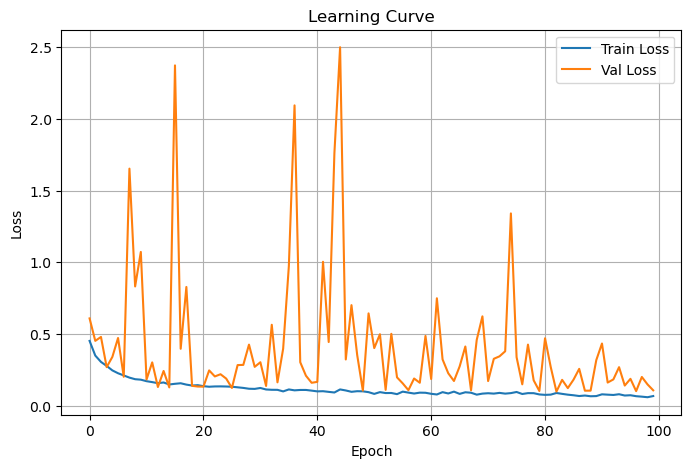

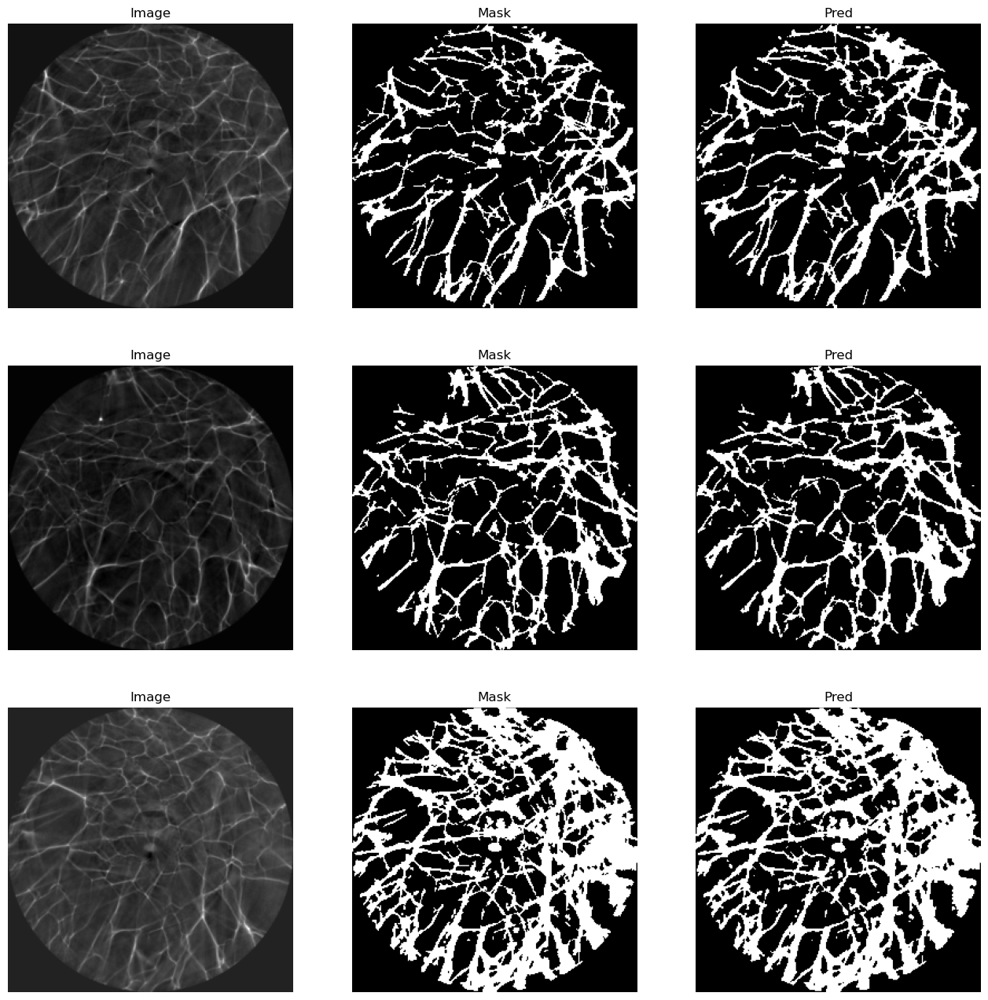

In [14]:
val_ratio = 0.1
n_total = len(train_dataset)
n_val = int(n_total * val_ratio)
n_train = n_total - n_val

train_ds, val_ds = random_split(train_dataset, [n_train, n_val])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

model.eval()
with torch.no_grad():
    imgs, masks = next(iter(train_loader))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste02.png", bbox_inches='tight', dpi = 300)
plt.show()

In [15]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

Acurácia: 0.97216796875


In [16]:
precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Precisão: 0.9331
Recall: 0.9670
F1-score: 0.9498


Nesse caso, com learning rate de 1 e-3, o desempenho da rede foi melhor em comparação com as condições iniciais, e a reconstrução ficou excelente.

  1%|          | 1/100 [00:05<09:06,  5.52s/it]

Epoch 1/100 - Train Loss: 0.5414 - Val Loss: 0.6689


  2%|▏         | 2/100 [00:11<09:12,  5.64s/it]

Epoch 2/100 - Train Loss: 0.4420 - Val Loss: 0.4684


  3%|▎         | 3/100 [00:16<08:48,  5.45s/it]

Epoch 3/100 - Train Loss: 0.3903 - Val Loss: 0.5510


  4%|▍         | 4/100 [00:22<08:46,  5.49s/it]

Epoch 4/100 - Train Loss: 0.3487 - Val Loss: 0.6361


  5%|▌         | 5/100 [00:27<08:40,  5.48s/it]

Epoch 5/100 - Train Loss: 0.3147 - Val Loss: 0.5058


  6%|▌         | 6/100 [00:32<08:30,  5.43s/it]

Epoch 6/100 - Train Loss: 0.2837 - Val Loss: 0.9243


  7%|▋         | 7/100 [00:38<08:21,  5.39s/it]

Epoch 7/100 - Train Loss: 0.2593 - Val Loss: 0.2397


  8%|▊         | 8/100 [00:43<08:11,  5.34s/it]

Epoch 8/100 - Train Loss: 0.2353 - Val Loss: 0.2190


  9%|▉         | 9/100 [00:48<08:03,  5.31s/it]

Epoch 9/100 - Train Loss: 0.2180 - Val Loss: 0.2580


 10%|█         | 10/100 [00:53<07:56,  5.29s/it]

Epoch 10/100 - Train Loss: 0.1999 - Val Loss: 0.3977


 11%|█         | 11/100 [00:59<07:56,  5.35s/it]

Epoch 11/100 - Train Loss: 0.1864 - Val Loss: 0.1669


 12%|█▏        | 12/100 [01:04<07:54,  5.39s/it]

Epoch 12/100 - Train Loss: 0.1773 - Val Loss: 0.2862


 13%|█▎        | 13/100 [01:10<07:55,  5.47s/it]

Epoch 13/100 - Train Loss: 0.1701 - Val Loss: 0.5044


 14%|█▍        | 14/100 [01:15<07:45,  5.41s/it]

Epoch 14/100 - Train Loss: 0.1651 - Val Loss: 0.3271


 15%|█▌        | 15/100 [01:21<07:52,  5.56s/it]

Epoch 15/100 - Train Loss: 0.1637 - Val Loss: 0.2003


 16%|█▌        | 16/100 [01:27<07:50,  5.60s/it]

Epoch 16/100 - Train Loss: 0.1570 - Val Loss: 0.1834


 17%|█▋        | 17/100 [01:32<07:38,  5.52s/it]

Epoch 17/100 - Train Loss: 0.1538 - Val Loss: 0.1743


 18%|█▊        | 18/100 [01:38<07:44,  5.66s/it]

Epoch 18/100 - Train Loss: 0.1494 - Val Loss: 0.1434


 19%|█▉        | 19/100 [01:44<07:31,  5.58s/it]

Epoch 19/100 - Train Loss: 0.1424 - Val Loss: 0.1411


 20%|██        | 20/100 [01:49<07:25,  5.57s/it]

Epoch 20/100 - Train Loss: 0.1410 - Val Loss: 0.2931


 21%|██        | 21/100 [01:55<07:19,  5.56s/it]

Epoch 21/100 - Train Loss: 0.1412 - Val Loss: 0.1117


 22%|██▏       | 22/100 [02:00<07:08,  5.50s/it]

Epoch 22/100 - Train Loss: 0.1395 - Val Loss: 0.1364


 23%|██▎       | 23/100 [02:06<07:04,  5.52s/it]

Epoch 23/100 - Train Loss: 0.1322 - Val Loss: 0.1698


 24%|██▍       | 24/100 [02:11<07:06,  5.61s/it]

Epoch 24/100 - Train Loss: 0.1299 - Val Loss: 0.1397


 25%|██▌       | 25/100 [02:17<06:52,  5.50s/it]

Epoch 25/100 - Train Loss: 0.1255 - Val Loss: 0.3178


 26%|██▌       | 26/100 [02:22<06:50,  5.55s/it]

Epoch 26/100 - Train Loss: 0.1322 - Val Loss: 0.2135


 27%|██▋       | 27/100 [02:28<06:42,  5.52s/it]

Epoch 27/100 - Train Loss: 0.1252 - Val Loss: 0.3283


 28%|██▊       | 28/100 [02:33<06:33,  5.47s/it]

Epoch 28/100 - Train Loss: 0.1206 - Val Loss: 0.1620


 29%|██▉       | 29/100 [02:39<06:28,  5.47s/it]

Epoch 29/100 - Train Loss: 0.1107 - Val Loss: 0.2565


 30%|███       | 30/100 [02:44<06:30,  5.57s/it]

Epoch 30/100 - Train Loss: 0.1121 - Val Loss: 0.1404


 31%|███       | 31/100 [02:50<06:27,  5.62s/it]

Epoch 31/100 - Train Loss: 0.1078 - Val Loss: 0.1182


 32%|███▏      | 32/100 [02:56<06:28,  5.71s/it]

Epoch 32/100 - Train Loss: 0.1132 - Val Loss: 0.3511


 33%|███▎      | 33/100 [03:02<06:23,  5.72s/it]

Epoch 33/100 - Train Loss: 0.1003 - Val Loss: 0.2371


 34%|███▍      | 34/100 [03:07<06:13,  5.66s/it]

Epoch 34/100 - Train Loss: 0.1038 - Val Loss: 0.1298


 35%|███▌      | 35/100 [03:13<06:01,  5.57s/it]

Epoch 35/100 - Train Loss: 0.1059 - Val Loss: 0.7081


 36%|███▌      | 36/100 [03:18<05:54,  5.54s/it]

Epoch 36/100 - Train Loss: 0.1041 - Val Loss: 0.1152


 37%|███▋      | 37/100 [03:24<05:51,  5.58s/it]

Epoch 37/100 - Train Loss: 0.1053 - Val Loss: 0.1458


 38%|███▊      | 38/100 [03:30<05:49,  5.64s/it]

Epoch 38/100 - Train Loss: 0.0986 - Val Loss: 0.2446


 39%|███▉      | 39/100 [03:35<05:37,  5.54s/it]

Epoch 39/100 - Train Loss: 0.1036 - Val Loss: 0.4524


 40%|████      | 40/100 [03:40<05:32,  5.54s/it]

Epoch 40/100 - Train Loss: 0.0988 - Val Loss: 0.1190


 41%|████      | 41/100 [03:46<05:30,  5.59s/it]

Epoch 41/100 - Train Loss: 0.0938 - Val Loss: 0.4209


 42%|████▏     | 42/100 [03:52<05:26,  5.63s/it]

Epoch 42/100 - Train Loss: 0.1080 - Val Loss: 0.3035


 43%|████▎     | 43/100 [03:57<05:17,  5.57s/it]

Epoch 43/100 - Train Loss: 0.0938 - Val Loss: 0.1959


 44%|████▍     | 44/100 [04:03<05:17,  5.68s/it]

Epoch 44/100 - Train Loss: 0.1012 - Val Loss: 0.6827


 45%|████▌     | 45/100 [04:09<05:12,  5.68s/it]

Epoch 45/100 - Train Loss: 0.0930 - Val Loss: 0.2675


 46%|████▌     | 46/100 [04:15<05:12,  5.79s/it]

Epoch 46/100 - Train Loss: 0.0911 - Val Loss: 0.2350


 47%|████▋     | 47/100 [04:20<04:59,  5.65s/it]

Epoch 47/100 - Train Loss: 0.0990 - Val Loss: 0.1215


 48%|████▊     | 48/100 [04:26<04:48,  5.56s/it]

Epoch 48/100 - Train Loss: 0.0871 - Val Loss: 0.1244


 49%|████▉     | 49/100 [04:31<04:43,  5.55s/it]

Epoch 49/100 - Train Loss: 0.0842 - Val Loss: 0.1209


 50%|█████     | 50/100 [04:36<04:34,  5.49s/it]

Epoch 50/100 - Train Loss: 0.0835 - Val Loss: 0.2614


 51%|█████     | 51/100 [04:42<04:27,  5.47s/it]

Epoch 51/100 - Train Loss: 0.0943 - Val Loss: 0.1123


 52%|█████▏    | 52/100 [04:47<04:22,  5.46s/it]

Epoch 52/100 - Train Loss: 0.0962 - Val Loss: 0.2438


 53%|█████▎    | 53/100 [04:53<04:20,  5.54s/it]

Epoch 53/100 - Train Loss: 0.0911 - Val Loss: 0.1890


 54%|█████▍    | 54/100 [04:59<04:14,  5.54s/it]

Epoch 54/100 - Train Loss: 0.1016 - Val Loss: 0.1122


 55%|█████▌    | 55/100 [05:05<04:18,  5.75s/it]

Epoch 55/100 - Train Loss: 0.0834 - Val Loss: 0.1437


 56%|█████▌    | 56/100 [05:10<04:08,  5.64s/it]

Epoch 56/100 - Train Loss: 0.0871 - Val Loss: 0.3548


 57%|█████▋    | 57/100 [05:16<03:58,  5.56s/it]

Epoch 57/100 - Train Loss: 0.0854 - Val Loss: 0.5430


 58%|█████▊    | 58/100 [05:21<03:55,  5.62s/it]

Epoch 58/100 - Train Loss: 0.0814 - Val Loss: 0.1807


 59%|█████▉    | 59/100 [05:27<03:54,  5.73s/it]

Epoch 59/100 - Train Loss: 0.0854 - Val Loss: 0.1238


 60%|██████    | 60/100 [05:33<03:45,  5.64s/it]

Epoch 60/100 - Train Loss: 0.0818 - Val Loss: 0.4605


 61%|██████    | 61/100 [05:38<03:36,  5.55s/it]

Epoch 61/100 - Train Loss: 0.0881 - Val Loss: 0.2318


 62%|██████▏   | 62/100 [05:44<03:38,  5.75s/it]

Epoch 62/100 - Train Loss: 0.0818 - Val Loss: 0.0956


 63%|██████▎   | 63/100 [05:50<03:31,  5.71s/it]

Epoch 63/100 - Train Loss: 0.0721 - Val Loss: 0.1196


 64%|██████▍   | 64/100 [05:55<03:20,  5.58s/it]

Epoch 64/100 - Train Loss: 0.0842 - Val Loss: 0.5161


 65%|██████▌   | 65/100 [06:01<03:15,  5.58s/it]

Epoch 65/100 - Train Loss: 0.0779 - Val Loss: 0.2829


 66%|██████▌   | 66/100 [06:06<03:08,  5.55s/it]

Epoch 66/100 - Train Loss: 0.0760 - Val Loss: 0.7451


 67%|██████▋   | 67/100 [06:12<03:03,  5.57s/it]

Epoch 67/100 - Train Loss: 0.0883 - Val Loss: 0.4959


 68%|██████▊   | 68/100 [06:18<02:58,  5.59s/it]

Epoch 68/100 - Train Loss: 0.0829 - Val Loss: 0.1038


 69%|██████▉   | 69/100 [06:23<02:55,  5.67s/it]

Epoch 69/100 - Train Loss: 0.0757 - Val Loss: 0.4471


 70%|███████   | 70/100 [06:29<02:46,  5.56s/it]

Epoch 70/100 - Train Loss: 0.0842 - Val Loss: 1.1672


 71%|███████   | 71/100 [06:34<02:38,  5.48s/it]

Epoch 71/100 - Train Loss: 0.0812 - Val Loss: 0.2758


 72%|███████▏  | 72/100 [06:40<02:36,  5.60s/it]

Epoch 72/100 - Train Loss: 0.0720 - Val Loss: 0.1988


 73%|███████▎  | 73/100 [06:45<02:28,  5.50s/it]

Epoch 73/100 - Train Loss: 0.0739 - Val Loss: 0.2400


 74%|███████▍  | 74/100 [06:51<02:24,  5.57s/it]

Epoch 74/100 - Train Loss: 0.0758 - Val Loss: 0.1645


 75%|███████▌  | 75/100 [06:56<02:17,  5.48s/it]

Epoch 75/100 - Train Loss: 0.0731 - Val Loss: 0.1161


 76%|███████▌  | 76/100 [07:02<02:11,  5.49s/it]

Epoch 76/100 - Train Loss: 0.0725 - Val Loss: 0.1128


 77%|███████▋  | 77/100 [07:07<02:07,  5.55s/it]

Epoch 77/100 - Train Loss: 0.0716 - Val Loss: 0.1708


 78%|███████▊  | 78/100 [07:13<02:00,  5.48s/it]

Epoch 78/100 - Train Loss: 0.0721 - Val Loss: 0.3578


 79%|███████▉  | 79/100 [07:18<01:55,  5.49s/it]

Epoch 79/100 - Train Loss: 0.0846 - Val Loss: 0.1264


 80%|████████  | 80/100 [07:24<01:49,  5.49s/it]

Epoch 80/100 - Train Loss: 0.0725 - Val Loss: 0.1149


 81%|████████  | 81/100 [07:29<01:44,  5.49s/it]

Epoch 81/100 - Train Loss: 0.0695 - Val Loss: 0.1567


 82%|████████▏ | 82/100 [07:35<01:38,  5.49s/it]

Epoch 82/100 - Train Loss: 0.0683 - Val Loss: 0.1182


 83%|████████▎ | 83/100 [07:40<01:34,  5.55s/it]

Epoch 83/100 - Train Loss: 0.0656 - Val Loss: 0.1645


 84%|████████▍ | 84/100 [07:46<01:27,  5.47s/it]

Epoch 84/100 - Train Loss: 0.0692 - Val Loss: 0.1538


 85%|████████▌ | 85/100 [07:51<01:21,  5.41s/it]

Epoch 85/100 - Train Loss: 0.0707 - Val Loss: 0.1115


 86%|████████▌ | 86/100 [07:56<01:16,  5.45s/it]

Epoch 86/100 - Train Loss: 0.0673 - Val Loss: 0.2126


 87%|████████▋ | 87/100 [08:02<01:11,  5.48s/it]

Epoch 87/100 - Train Loss: 0.0701 - Val Loss: 0.1212


 88%|████████▊ | 88/100 [08:08<01:07,  5.64s/it]

Epoch 88/100 - Train Loss: 0.0638 - Val Loss: 0.1297


 89%|████████▉ | 89/100 [08:13<01:01,  5.55s/it]

Epoch 89/100 - Train Loss: 0.0597 - Val Loss: 0.2879


 90%|█████████ | 90/100 [08:19<00:56,  5.61s/it]

Epoch 90/100 - Train Loss: 0.0629 - Val Loss: 0.1659


 91%|█████████ | 91/100 [08:24<00:49,  5.52s/it]

Epoch 91/100 - Train Loss: 0.0690 - Val Loss: 0.1856


 92%|█████████▏| 92/100 [08:30<00:43,  5.46s/it]

Epoch 92/100 - Train Loss: 0.0612 - Val Loss: 0.1643


 93%|█████████▎| 93/100 [08:35<00:38,  5.48s/it]

Epoch 93/100 - Train Loss: 0.0632 - Val Loss: 0.1147


 94%|█████████▍| 94/100 [08:41<00:32,  5.44s/it]

Epoch 94/100 - Train Loss: 0.0599 - Val Loss: 0.1197


 95%|█████████▌| 95/100 [08:46<00:27,  5.48s/it]

Epoch 95/100 - Train Loss: 0.0645 - Val Loss: 0.2859


 96%|█████████▌| 96/100 [08:51<00:21,  5.43s/it]

Epoch 96/100 - Train Loss: 0.0627 - Val Loss: 0.1643


 97%|█████████▋| 97/100 [08:57<00:16,  5.51s/it]

Epoch 97/100 - Train Loss: 0.0581 - Val Loss: 0.1092


 98%|█████████▊| 98/100 [09:03<00:11,  5.60s/it]

Epoch 98/100 - Train Loss: 0.0628 - Val Loss: 0.2987


 99%|█████████▉| 99/100 [09:08<00:05,  5.54s/it]

Epoch 99/100 - Train Loss: 0.0608 - Val Loss: 0.3426


100%|██████████| 100/100 [09:14<00:00,  5.55s/it]

Epoch 100/100 - Train Loss: 0.0672 - Val Loss: 0.1774


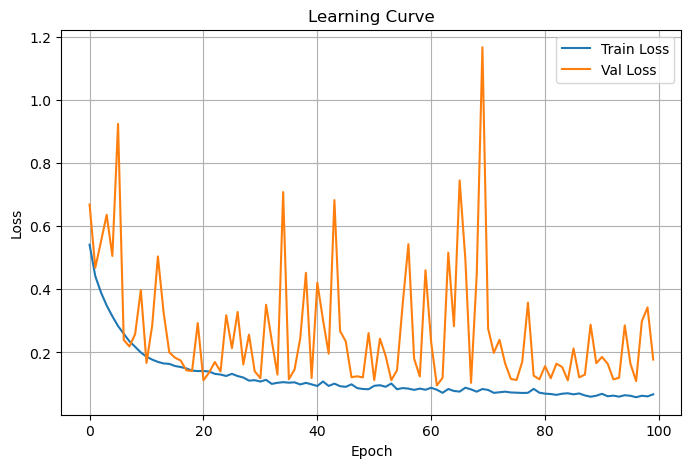

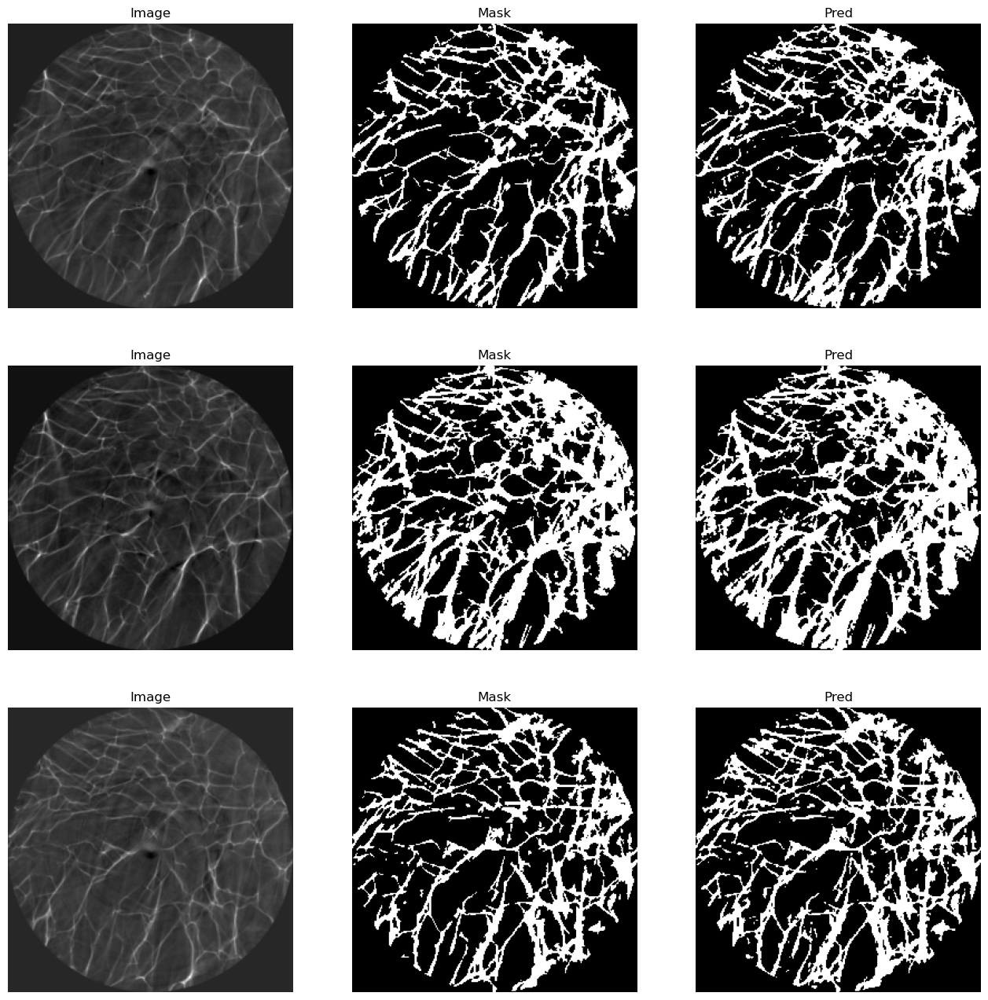

In [18]:
val_ratio2 = 0.2
n_total = len(train_dataset)
n_val2 = int(n_total * val_ratio2)
n_train2 = n_total - n_val2

train_ds, val_ds = random_split(train_dataset, [n_train2, n_val2])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

model.eval()
with torch.no_grad():
    imgs, masks = next(iter(train_loader))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste03.png", bbox_inches='tight', dpi = 300)
plt.show()

In [19]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Acurácia: 0.9572944641113281
Precisão: 0.8590
Recall: 0.9926
F1-score: 0.9210


Mudar a proporção de treino e validação piorou um pouco o desempenho da rede, apesar de não ter feito muita diferença qualitativamente, apenas nos scores de precisão.

  1%|          | 1/100 [00:07<12:27,  7.55s/it]

Epoch 1/100 - Train Loss: 0.4668 - Val Loss: 0.5538


  2%|▏         | 2/100 [00:12<10:12,  6.25s/it]

Epoch 2/100 - Train Loss: 0.3498 - Val Loss: 0.5129


  3%|▎         | 3/100 [00:18<09:32,  5.90s/it]

Epoch 3/100 - Train Loss: 0.2989 - Val Loss: 0.4115


  4%|▍         | 4/100 [00:23<09:07,  5.70s/it]

Epoch 4/100 - Train Loss: 0.2624 - Val Loss: 0.3974


  5%|▌         | 5/100 [00:29<08:50,  5.58s/it]

Epoch 5/100 - Train Loss: 0.2335 - Val Loss: 0.2443


  6%|▌         | 6/100 [00:35<08:53,  5.68s/it]

Epoch 6/100 - Train Loss: 0.2164 - Val Loss: 0.5289


  7%|▋         | 7/100 [00:40<08:43,  5.62s/it]

Epoch 7/100 - Train Loss: 0.1974 - Val Loss: 0.4527


  8%|▊         | 8/100 [00:46<08:37,  5.63s/it]

Epoch 8/100 - Train Loss: 0.1785 - Val Loss: 0.3302


  9%|▉         | 9/100 [00:51<08:30,  5.62s/it]

Epoch 9/100 - Train Loss: 0.1711 - Val Loss: 0.5984


 10%|█         | 10/100 [00:57<08:34,  5.72s/it]

Epoch 10/100 - Train Loss: 0.1632 - Val Loss: 0.1957


 11%|█         | 11/100 [01:03<08:24,  5.67s/it]

Epoch 11/100 - Train Loss: 0.1554 - Val Loss: 0.1649


 12%|█▏        | 12/100 [01:08<08:09,  5.56s/it]

Epoch 12/100 - Train Loss: 0.1467 - Val Loss: 0.4372


 13%|█▎        | 13/100 [01:14<08:06,  5.59s/it]

Epoch 13/100 - Train Loss: 0.1461 - Val Loss: 1.1576


 14%|█▍        | 14/100 [01:19<08:03,  5.62s/it]

Epoch 14/100 - Train Loss: 0.1381 - Val Loss: 0.3690


 15%|█▌        | 15/100 [01:25<07:57,  5.62s/it]

Epoch 15/100 - Train Loss: 0.1368 - Val Loss: 0.2436


 16%|█▌        | 16/100 [01:31<07:53,  5.63s/it]

Epoch 16/100 - Train Loss: 0.1318 - Val Loss: 0.2559


 17%|█▋        | 17/100 [01:36<07:39,  5.53s/it]

Epoch 17/100 - Train Loss: 0.1413 - Val Loss: 0.1379


 18%|█▊        | 18/100 [01:41<07:26,  5.45s/it]

Epoch 18/100 - Train Loss: 0.1302 - Val Loss: 0.1659


 19%|█▉        | 19/100 [01:47<07:24,  5.49s/it]

Epoch 19/100 - Train Loss: 0.1345 - Val Loss: 0.2053


 20%|██        | 20/100 [01:52<07:14,  5.43s/it]

Epoch 20/100 - Train Loss: 0.1188 - Val Loss: 0.2487


 21%|██        | 21/100 [01:57<07:06,  5.40s/it]

Epoch 21/100 - Train Loss: 0.1313 - Val Loss: 0.1735


 22%|██▏       | 22/100 [02:03<07:04,  5.44s/it]

Epoch 22/100 - Train Loss: 0.1190 - Val Loss: 1.7792


 23%|██▎       | 23/100 [02:08<06:55,  5.40s/it]

Epoch 23/100 - Train Loss: 0.1171 - Val Loss: 0.2064


 24%|██▍       | 24/100 [02:14<06:48,  5.38s/it]

Epoch 24/100 - Train Loss: 0.1110 - Val Loss: 0.1523


 25%|██▌       | 25/100 [02:19<06:40,  5.35s/it]

Epoch 25/100 - Train Loss: 0.1061 - Val Loss: 0.1191


 26%|██▌       | 26/100 [02:24<06:34,  5.33s/it]

Epoch 26/100 - Train Loss: 0.1037 - Val Loss: 0.8950


 27%|██▋       | 27/100 [02:29<06:26,  5.30s/it]

Epoch 27/100 - Train Loss: 0.1145 - Val Loss: 1.5971


 28%|██▊       | 28/100 [02:35<06:24,  5.34s/it]

Epoch 28/100 - Train Loss: 0.1310 - Val Loss: 0.7661


 29%|██▉       | 29/100 [02:40<06:22,  5.39s/it]

Epoch 29/100 - Train Loss: 0.1058 - Val Loss: 0.2341


 30%|███       | 30/100 [02:46<06:15,  5.37s/it]

Epoch 30/100 - Train Loss: 0.1009 - Val Loss: 0.1709


 31%|███       | 31/100 [02:51<06:09,  5.35s/it]

Epoch 31/100 - Train Loss: 0.1120 - Val Loss: 0.1068


 32%|███▏      | 32/100 [02:56<06:05,  5.38s/it]

Epoch 32/100 - Train Loss: 0.1111 - Val Loss: 0.3975


 33%|███▎      | 33/100 [03:02<06:02,  5.42s/it]

Epoch 33/100 - Train Loss: 0.1047 - Val Loss: 0.9441


 34%|███▍      | 34/100 [03:07<05:55,  5.39s/it]

Epoch 34/100 - Train Loss: 0.1025 - Val Loss: 0.2038


 35%|███▌      | 35/100 [03:13<05:54,  5.45s/it]

Epoch 35/100 - Train Loss: 0.0966 - Val Loss: 0.5602


 36%|███▌      | 36/100 [03:18<05:51,  5.50s/it]

Epoch 36/100 - Train Loss: 0.1012 - Val Loss: 0.4846


 37%|███▋      | 37/100 [03:24<05:45,  5.49s/it]

Epoch 37/100 - Train Loss: 0.1027 - Val Loss: 1.6853


 38%|███▊      | 38/100 [03:30<05:48,  5.62s/it]

Epoch 38/100 - Train Loss: 0.1156 - Val Loss: 2.7783


 39%|███▉      | 39/100 [03:36<05:49,  5.74s/it]

Epoch 39/100 - Train Loss: 0.1050 - Val Loss: 0.3046


 40%|████      | 40/100 [03:41<05:36,  5.61s/it]

Epoch 40/100 - Train Loss: 0.1045 - Val Loss: 0.1960


 41%|████      | 41/100 [03:47<05:31,  5.62s/it]

Epoch 41/100 - Train Loss: 0.0939 - Val Loss: 0.1599


 42%|████▏     | 42/100 [03:52<05:25,  5.62s/it]

Epoch 42/100 - Train Loss: 0.0953 - Val Loss: 0.1084


 43%|████▎     | 43/100 [03:58<05:15,  5.54s/it]

Epoch 43/100 - Train Loss: 0.0942 - Val Loss: 0.7154


 44%|████▍     | 44/100 [04:04<05:17,  5.66s/it]

Epoch 44/100 - Train Loss: 0.0960 - Val Loss: 0.2424


 45%|████▌     | 45/100 [04:09<05:07,  5.59s/it]

Epoch 45/100 - Train Loss: 0.0943 - Val Loss: 0.2619


 46%|████▌     | 46/100 [04:15<05:00,  5.56s/it]

Epoch 46/100 - Train Loss: 0.0891 - Val Loss: 0.1604


 47%|████▋     | 47/100 [04:20<04:55,  5.58s/it]

Epoch 47/100 - Train Loss: 0.0835 - Val Loss: 0.2117


 48%|████▊     | 48/100 [04:26<04:49,  5.57s/it]

Epoch 48/100 - Train Loss: 0.0879 - Val Loss: 0.1325


 49%|████▉     | 49/100 [04:31<04:43,  5.56s/it]

Epoch 49/100 - Train Loss: 0.0854 - Val Loss: 0.2808


 50%|█████     | 50/100 [04:37<04:38,  5.58s/it]

Epoch 50/100 - Train Loss: 0.0913 - Val Loss: 0.1870


 51%|█████     | 51/100 [04:43<04:33,  5.58s/it]

Epoch 51/100 - Train Loss: 0.0823 - Val Loss: 0.3987


 52%|█████▏    | 52/100 [04:49<04:37,  5.77s/it]

Epoch 52/100 - Train Loss: 0.0837 - Val Loss: 0.1134


 53%|█████▎    | 53/100 [04:54<04:28,  5.72s/it]

Epoch 53/100 - Train Loss: 0.0827 - Val Loss: 0.1147


 54%|█████▍    | 54/100 [05:00<04:20,  5.67s/it]

Epoch 54/100 - Train Loss: 0.0804 - Val Loss: 0.2416


 55%|█████▌    | 55/100 [05:05<04:11,  5.59s/it]

Epoch 55/100 - Train Loss: 0.0972 - Val Loss: 0.1605


 56%|█████▌    | 56/100 [05:11<04:04,  5.57s/it]

Epoch 56/100 - Train Loss: 0.0864 - Val Loss: 0.1586


 57%|█████▋    | 57/100 [05:17<04:04,  5.68s/it]

Epoch 57/100 - Train Loss: 0.0905 - Val Loss: 0.3495


 58%|█████▊    | 58/100 [05:22<03:57,  5.65s/it]

Epoch 58/100 - Train Loss: 0.0797 - Val Loss: 0.2558


 59%|█████▉    | 59/100 [05:28<03:48,  5.57s/it]

Epoch 59/100 - Train Loss: 0.0811 - Val Loss: 0.1757


 60%|██████    | 60/100 [05:34<03:48,  5.71s/it]

Epoch 60/100 - Train Loss: 0.0803 - Val Loss: 0.2005


 61%|██████    | 61/100 [05:39<03:39,  5.64s/it]

Epoch 61/100 - Train Loss: 0.0844 - Val Loss: 0.1184


 62%|██████▏   | 62/100 [05:45<03:35,  5.67s/it]

Epoch 62/100 - Train Loss: 0.0821 - Val Loss: 0.1832


 63%|██████▎   | 63/100 [05:51<03:30,  5.68s/it]

Epoch 63/100 - Train Loss: 0.0790 - Val Loss: 0.2834


 64%|██████▍   | 64/100 [05:56<03:24,  5.68s/it]

Epoch 64/100 - Train Loss: 0.0841 - Val Loss: 0.6142


 65%|██████▌   | 65/100 [06:03<03:25,  5.88s/it]

Epoch 65/100 - Train Loss: 0.0759 - Val Loss: 0.2051


 66%|██████▌   | 66/100 [06:08<03:18,  5.83s/it]

Epoch 66/100 - Train Loss: 0.0792 - Val Loss: 0.1508


 67%|██████▋   | 67/100 [06:14<03:13,  5.85s/it]

Epoch 67/100 - Train Loss: 0.0752 - Val Loss: 0.2343


 68%|██████▊   | 68/100 [06:20<03:05,  5.80s/it]

Epoch 68/100 - Train Loss: 0.0712 - Val Loss: 0.1077


 69%|██████▉   | 69/100 [06:26<02:56,  5.71s/it]

Epoch 69/100 - Train Loss: 0.0678 - Val Loss: 0.1561


 70%|███████   | 70/100 [06:31<02:51,  5.71s/it]

Epoch 70/100 - Train Loss: 0.0692 - Val Loss: 0.3686


 71%|███████   | 71/100 [06:37<02:44,  5.67s/it]

Epoch 71/100 - Train Loss: 0.0782 - Val Loss: 0.5303


 72%|███████▏  | 72/100 [06:42<02:38,  5.65s/it]

Epoch 72/100 - Train Loss: 0.0817 - Val Loss: 0.1155


 73%|███████▎  | 73/100 [06:48<02:31,  5.61s/it]

Epoch 73/100 - Train Loss: 0.0747 - Val Loss: 0.1393


 74%|███████▍  | 74/100 [06:54<02:27,  5.68s/it]

Epoch 74/100 - Train Loss: 0.0834 - Val Loss: 0.5176


 75%|███████▌  | 75/100 [06:59<02:20,  5.63s/it]

Epoch 75/100 - Train Loss: 0.0701 - Val Loss: 0.6901


 76%|███████▌  | 76/100 [07:05<02:14,  5.61s/it]

Epoch 76/100 - Train Loss: 0.0700 - Val Loss: 0.5413


 77%|███████▋  | 77/100 [07:10<02:07,  5.54s/it]

Epoch 77/100 - Train Loss: 0.0698 - Val Loss: 0.1846


 78%|███████▊  | 78/100 [07:16<02:02,  5.57s/it]

Epoch 78/100 - Train Loss: 0.0821 - Val Loss: 0.2663


 79%|███████▉  | 79/100 [07:22<01:57,  5.60s/it]

Epoch 79/100 - Train Loss: 0.0662 - Val Loss: 0.2916


 80%|████████  | 80/100 [07:27<01:53,  5.65s/it]

Epoch 80/100 - Train Loss: 0.0659 - Val Loss: 0.1570


 81%|████████  | 81/100 [07:33<01:48,  5.69s/it]

Epoch 81/100 - Train Loss: 0.0636 - Val Loss: 0.1524


 82%|████████▏ | 82/100 [07:38<01:40,  5.58s/it]

Epoch 82/100 - Train Loss: 0.0629 - Val Loss: 0.1720


 83%|████████▎ | 83/100 [07:44<01:34,  5.58s/it]

Epoch 83/100 - Train Loss: 0.0645 - Val Loss: 0.1768


 84%|████████▍ | 84/100 [07:50<01:29,  5.60s/it]

Epoch 84/100 - Train Loss: 0.0722 - Val Loss: 0.1117


 85%|████████▌ | 85/100 [07:55<01:24,  5.60s/it]

Epoch 85/100 - Train Loss: 0.0680 - Val Loss: 0.1699


 86%|████████▌ | 86/100 [08:01<01:17,  5.50s/it]

Epoch 86/100 - Train Loss: 0.0704 - Val Loss: 0.3451


 87%|████████▋ | 87/100 [08:06<01:11,  5.52s/it]

Epoch 87/100 - Train Loss: 0.0690 - Val Loss: 0.3293


 88%|████████▊ | 88/100 [08:12<01:05,  5.49s/it]

Epoch 88/100 - Train Loss: 0.0613 - Val Loss: 0.1180


 89%|████████▉ | 89/100 [08:17<01:00,  5.48s/it]

Epoch 89/100 - Train Loss: 0.0622 - Val Loss: 0.3065


 90%|█████████ | 90/100 [08:22<00:54,  5.45s/it]

Epoch 90/100 - Train Loss: 0.0613 - Val Loss: 0.1044


 91%|█████████ | 91/100 [08:28<00:48,  5.43s/it]

Epoch 91/100 - Train Loss: 0.0617 - Val Loss: 0.1092


 92%|█████████▏| 92/100 [08:34<00:44,  5.58s/it]

Epoch 92/100 - Train Loss: 0.0581 - Val Loss: 0.4612


 93%|█████████▎| 93/100 [08:39<00:38,  5.53s/it]

Epoch 93/100 - Train Loss: 0.0596 - Val Loss: 0.0973


 94%|█████████▍| 94/100 [08:45<00:34,  5.72s/it]

Epoch 94/100 - Train Loss: 0.0570 - Val Loss: 0.1728


 95%|█████████▌| 95/100 [08:51<00:28,  5.66s/it]

Epoch 95/100 - Train Loss: 0.0618 - Val Loss: 0.1307


 96%|█████████▌| 96/100 [08:56<00:22,  5.61s/it]

Epoch 96/100 - Train Loss: 0.0693 - Val Loss: 0.1303


 97%|█████████▋| 97/100 [09:02<00:16,  5.62s/it]

Epoch 97/100 - Train Loss: 0.0699 - Val Loss: 0.5078


 98%|█████████▊| 98/100 [09:07<00:11,  5.54s/it]

Epoch 98/100 - Train Loss: 0.0639 - Val Loss: 0.3989


 99%|█████████▉| 99/100 [09:13<00:05,  5.62s/it]

Epoch 99/100 - Train Loss: 0.0592 - Val Loss: 0.1094


100%|██████████| 100/100 [09:18<00:00,  5.59s/it]

Epoch 100/100 - Train Loss: 0.0555 - Val Loss: 0.2264


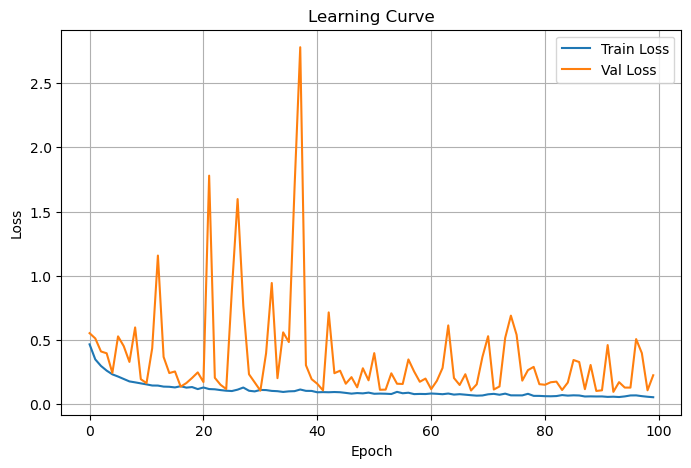

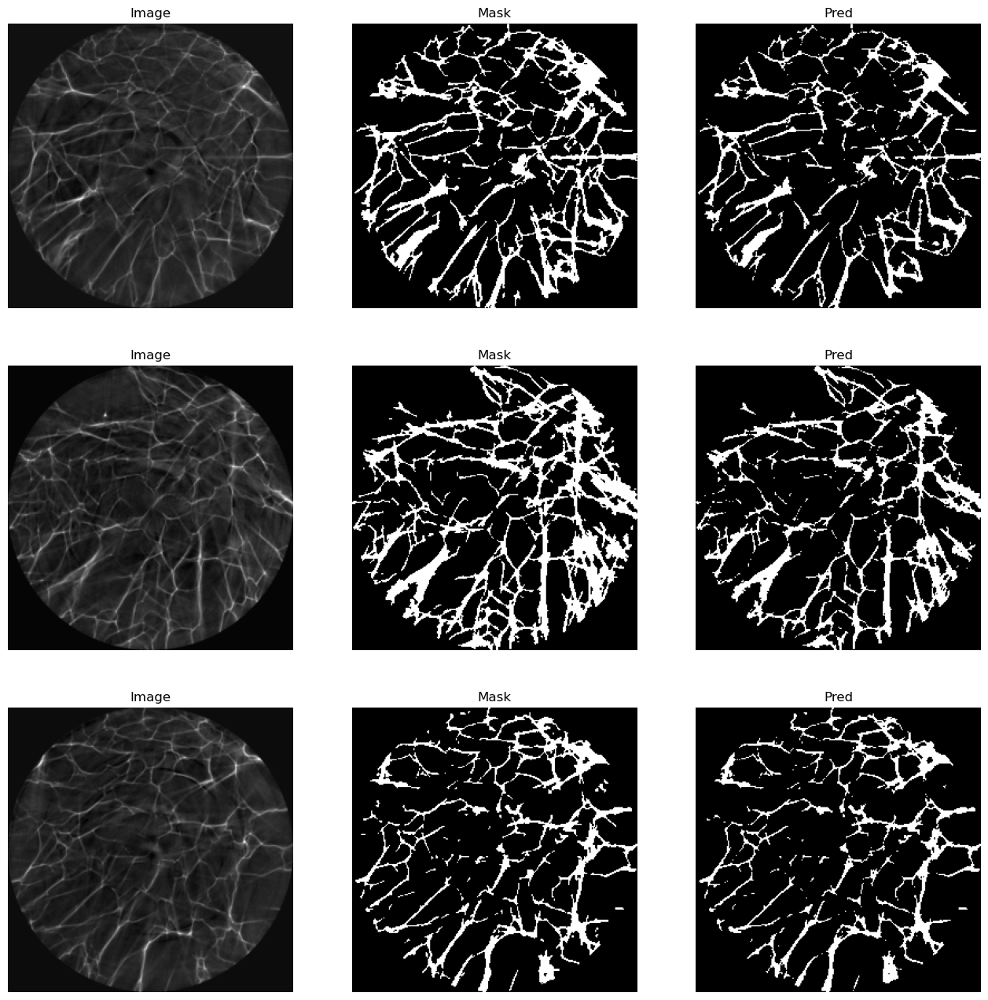

In [20]:
val_ratio = 0.1
n_total = len(train_dataset)
n_val = int(n_total * val_ratio)
n_train = n_total - n_val

train_ds, val_ds = random_split(train_dataset, [n_train, n_val])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-2)

n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

model.eval()
with torch.no_grad():
    imgs, masks = next(iter(train_loader))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste04.png", bbox_inches='tight', dpi = 300)
plt.show()

In [21]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Acurácia: 0.95465087890625
Precisão: 0.9941
Recall: 0.7630
F1-score: 0.8634


Mudar o otimizador para AdamW piorou bastante o desempenho da rede. Observando as imagens de output, percebe-se que esse otimizador deixou a rede muito mais conservadora com os dados, pegando linhas muito finas e ignorando certas regiões. Talvez alterar o weight_decay melhore o desempenho.

- Carreguem imagens que a rede não viu durante o treino, qual o desempenho (qualitativo) do modelo?

In [22]:
test_dataset = TomoDataset("/mnt/bgfs/projects/tomo_nano/yasmin/data/train_data_li_100/images", "/mnt/bgfs/projects/tomo_nano/yasmin/data/train_data_li_100/masks", transform=transform)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

  1%|          | 1/100 [00:08<14:43,  8.92s/it]

Epoch 1/100 - Train Loss: 0.5739 - Val Loss: 0.6593


  2%|▏         | 2/100 [00:14<11:11,  6.86s/it]

Epoch 2/100 - Train Loss: 0.4664 - Val Loss: 0.4634


  3%|▎         | 3/100 [00:19<10:07,  6.26s/it]

Epoch 3/100 - Train Loss: 0.4127 - Val Loss: 0.3904


  4%|▍         | 4/100 [00:25<09:53,  6.19s/it]

Epoch 4/100 - Train Loss: 0.3722 - Val Loss: 0.3414


  5%|▌         | 5/100 [00:31<09:31,  6.01s/it]

Epoch 5/100 - Train Loss: 0.3376 - Val Loss: 0.3302


  6%|▌         | 6/100 [00:37<09:14,  5.89s/it]

Epoch 6/100 - Train Loss: 0.2969 - Val Loss: 0.2913


  7%|▋         | 7/100 [00:43<09:11,  5.93s/it]

Epoch 7/100 - Train Loss: 0.2709 - Val Loss: 0.2768


  8%|▊         | 8/100 [00:49<09:01,  5.89s/it]

Epoch 8/100 - Train Loss: 0.2488 - Val Loss: 0.2721


  9%|▉         | 9/100 [00:54<08:54,  5.88s/it]

Epoch 9/100 - Train Loss: 0.2357 - Val Loss: 0.2360


 10%|█         | 10/100 [01:00<08:52,  5.92s/it]

Epoch 10/100 - Train Loss: 0.2140 - Val Loss: 0.2087


 11%|█         | 11/100 [01:06<08:33,  5.77s/it]

Epoch 11/100 - Train Loss: 0.2026 - Val Loss: 0.2413


 12%|█▏        | 12/100 [01:11<08:18,  5.67s/it]

Epoch 12/100 - Train Loss: 0.1852 - Val Loss: 0.1775


 13%|█▎        | 13/100 [01:17<08:04,  5.57s/it]

Epoch 13/100 - Train Loss: 0.1803 - Val Loss: 0.3695


 14%|█▍        | 14/100 [01:22<08:00,  5.59s/it]

Epoch 14/100 - Train Loss: 0.1779 - Val Loss: 0.1867


 15%|█▌        | 15/100 [01:28<07:53,  5.58s/it]

Epoch 15/100 - Train Loss: 0.1706 - Val Loss: 0.2418


 16%|█▌        | 16/100 [01:34<07:54,  5.65s/it]

Epoch 16/100 - Train Loss: 0.1611 - Val Loss: 0.3081


 17%|█▋        | 17/100 [01:39<07:48,  5.65s/it]

Epoch 17/100 - Train Loss: 0.1596 - Val Loss: 0.1449


 18%|█▊        | 18/100 [01:45<07:47,  5.70s/it]

Epoch 18/100 - Train Loss: 0.1474 - Val Loss: 0.2555


 19%|█▉        | 19/100 [01:51<07:35,  5.62s/it]

Epoch 19/100 - Train Loss: 0.1512 - Val Loss: 0.1505


 20%|██        | 20/100 [01:56<07:31,  5.64s/it]

Epoch 20/100 - Train Loss: 0.1434 - Val Loss: 0.5201


 21%|██        | 21/100 [02:02<07:31,  5.71s/it]

Epoch 21/100 - Train Loss: 0.1420 - Val Loss: 0.3566


 22%|██▏       | 22/100 [02:08<07:24,  5.70s/it]

Epoch 22/100 - Train Loss: 0.1327 - Val Loss: 0.1194


 23%|██▎       | 23/100 [02:13<07:15,  5.66s/it]

Epoch 23/100 - Train Loss: 0.1343 - Val Loss: 0.2803


 24%|██▍       | 24/100 [02:20<07:20,  5.80s/it]

Epoch 24/100 - Train Loss: 0.1273 - Val Loss: 0.1163


 25%|██▌       | 25/100 [02:25<07:17,  5.83s/it]

Epoch 25/100 - Train Loss: 0.1240 - Val Loss: 0.1726


 26%|██▌       | 26/100 [02:32<07:19,  5.94s/it]

Epoch 26/100 - Train Loss: 0.1226 - Val Loss: 0.1902


 27%|██▋       | 27/100 [02:37<07:08,  5.87s/it]

Epoch 27/100 - Train Loss: 0.1233 - Val Loss: 0.1510


 28%|██▊       | 28/100 [02:43<06:57,  5.80s/it]

Epoch 28/100 - Train Loss: 0.1171 - Val Loss: 0.4494


 29%|██▉       | 29/100 [02:49<06:48,  5.75s/it]

Epoch 29/100 - Train Loss: 0.1199 - Val Loss: 0.1996


 30%|███       | 30/100 [02:54<06:40,  5.72s/it]

Epoch 30/100 - Train Loss: 0.1169 - Val Loss: 0.1232


 31%|███       | 31/100 [03:00<06:34,  5.72s/it]

Epoch 31/100 - Train Loss: 0.1049 - Val Loss: 0.3895


 32%|███▏      | 32/100 [03:06<06:25,  5.67s/it]

Epoch 32/100 - Train Loss: 0.1041 - Val Loss: 0.1919


 33%|███▎      | 33/100 [03:11<06:15,  5.60s/it]

Epoch 33/100 - Train Loss: 0.0971 - Val Loss: 0.2281


 34%|███▍      | 34/100 [03:16<06:06,  5.55s/it]

Epoch 34/100 - Train Loss: 0.1045 - Val Loss: 0.1319


 35%|███▌      | 35/100 [03:22<06:02,  5.58s/it]

Epoch 35/100 - Train Loss: 0.0955 - Val Loss: 0.1585


 36%|███▌      | 36/100 [03:27<05:54,  5.54s/it]

Epoch 36/100 - Train Loss: 0.1096 - Val Loss: 0.1424


 37%|███▋      | 37/100 [03:33<05:47,  5.52s/it]

Epoch 37/100 - Train Loss: 0.1085 - Val Loss: 0.1389


 38%|███▊      | 38/100 [03:38<05:40,  5.49s/it]

Epoch 38/100 - Train Loss: 0.1079 - Val Loss: 0.2206


 39%|███▉      | 39/100 [03:44<05:34,  5.48s/it]

Epoch 39/100 - Train Loss: 0.1014 - Val Loss: 0.2229


 40%|████      | 40/100 [03:49<05:28,  5.47s/it]

Epoch 40/100 - Train Loss: 0.1035 - Val Loss: 0.1503


 41%|████      | 41/100 [03:55<05:26,  5.54s/it]

Epoch 41/100 - Train Loss: 0.1029 - Val Loss: 0.2917


 42%|████▏     | 42/100 [04:01<05:23,  5.58s/it]

Epoch 42/100 - Train Loss: 0.1007 - Val Loss: 0.2069


 43%|████▎     | 43/100 [04:06<05:20,  5.62s/it]

Epoch 43/100 - Train Loss: 0.1015 - Val Loss: 0.2008


 44%|████▍     | 44/100 [04:12<05:12,  5.58s/it]

Epoch 44/100 - Train Loss: 0.0963 - Val Loss: 0.6347


 45%|████▌     | 45/100 [04:17<05:04,  5.54s/it]

Epoch 45/100 - Train Loss: 0.1025 - Val Loss: 0.1901


 46%|████▌     | 46/100 [04:23<04:58,  5.53s/it]

Epoch 46/100 - Train Loss: 0.1046 - Val Loss: 0.1305


 47%|████▋     | 47/100 [04:28<04:51,  5.50s/it]

Epoch 47/100 - Train Loss: 0.0917 - Val Loss: 0.1430


 48%|████▊     | 48/100 [04:34<04:47,  5.53s/it]

Epoch 48/100 - Train Loss: 0.0926 - Val Loss: 0.1233


 49%|████▉     | 49/100 [04:40<04:44,  5.58s/it]

Epoch 49/100 - Train Loss: 0.0973 - Val Loss: 0.4938


 50%|█████     | 50/100 [04:45<04:38,  5.56s/it]

Epoch 50/100 - Train Loss: 0.0965 - Val Loss: 0.1213


 51%|█████     | 51/100 [04:51<04:38,  5.68s/it]

Epoch 51/100 - Train Loss: 0.0905 - Val Loss: 0.1384


 52%|█████▏    | 52/100 [04:56<04:29,  5.61s/it]

Epoch 52/100 - Train Loss: 0.0903 - Val Loss: 0.2887


 53%|█████▎    | 53/100 [05:02<04:24,  5.62s/it]

Epoch 53/100 - Train Loss: 0.1014 - Val Loss: 0.1300


 54%|█████▍    | 54/100 [05:08<04:21,  5.67s/it]

Epoch 54/100 - Train Loss: 0.0875 - Val Loss: 0.1033


 55%|█████▌    | 55/100 [05:14<04:16,  5.70s/it]

Epoch 55/100 - Train Loss: 0.0879 - Val Loss: 0.1131


 56%|█████▌    | 56/100 [05:19<04:11,  5.72s/it]

Epoch 56/100 - Train Loss: 0.0829 - Val Loss: 0.1742


 57%|█████▋    | 57/100 [05:25<04:09,  5.81s/it]

Epoch 57/100 - Train Loss: 0.0825 - Val Loss: 0.1164


 58%|█████▊    | 58/100 [05:32<04:07,  5.89s/it]

Epoch 58/100 - Train Loss: 0.0783 - Val Loss: 0.2908


 59%|█████▉    | 59/100 [05:37<03:55,  5.73s/it]

Epoch 59/100 - Train Loss: 0.0758 - Val Loss: 0.6886


 60%|██████    | 60/100 [05:42<03:45,  5.63s/it]

Epoch 60/100 - Train Loss: 0.0809 - Val Loss: 0.1200


 61%|██████    | 61/100 [05:48<03:41,  5.69s/it]

Epoch 61/100 - Train Loss: 0.0895 - Val Loss: 0.3464


 62%|██████▏   | 62/100 [05:54<03:35,  5.68s/it]

Epoch 62/100 - Train Loss: 0.0789 - Val Loss: 0.1292


 63%|██████▎   | 63/100 [05:59<03:26,  5.59s/it]

Epoch 63/100 - Train Loss: 0.0681 - Val Loss: 0.1278


 64%|██████▍   | 64/100 [06:05<03:18,  5.52s/it]

Epoch 64/100 - Train Loss: 0.0760 - Val Loss: 0.2462


 65%|██████▌   | 65/100 [06:10<03:11,  5.48s/it]

Epoch 65/100 - Train Loss: 0.0802 - Val Loss: 0.3284


 66%|██████▌   | 66/100 [06:15<03:05,  5.45s/it]

Epoch 66/100 - Train Loss: 0.0723 - Val Loss: 0.1043


 67%|██████▋   | 67/100 [06:21<03:01,  5.49s/it]

Epoch 67/100 - Train Loss: 0.0796 - Val Loss: 0.1588


 68%|██████▊   | 68/100 [06:27<02:58,  5.58s/it]

Epoch 68/100 - Train Loss: 0.0762 - Val Loss: 0.1032


 69%|██████▉   | 69/100 [06:32<02:53,  5.59s/it]

Epoch 69/100 - Train Loss: 0.0698 - Val Loss: 0.1662


 70%|███████   | 70/100 [06:38<02:46,  5.54s/it]

Epoch 70/100 - Train Loss: 0.0693 - Val Loss: 0.1678


 71%|███████   | 71/100 [06:43<02:41,  5.57s/it]

Epoch 71/100 - Train Loss: 0.0687 - Val Loss: 0.1758


 72%|███████▏  | 72/100 [06:49<02:36,  5.59s/it]

Epoch 72/100 - Train Loss: 0.0654 - Val Loss: 0.2362


 73%|███████▎  | 73/100 [06:54<02:29,  5.52s/it]

Epoch 73/100 - Train Loss: 0.0697 - Val Loss: 0.2309


 74%|███████▍  | 74/100 [07:00<02:23,  5.54s/it]

Epoch 74/100 - Train Loss: 0.0727 - Val Loss: 0.2587


 75%|███████▌  | 75/100 [07:05<02:17,  5.49s/it]

Epoch 75/100 - Train Loss: 0.0803 - Val Loss: 0.4713


 76%|███████▌  | 76/100 [07:11<02:12,  5.52s/it]

Epoch 76/100 - Train Loss: 0.0750 - Val Loss: 0.1268


 77%|███████▋  | 77/100 [07:17<02:07,  5.56s/it]

Epoch 77/100 - Train Loss: 0.0703 - Val Loss: 0.1167


 78%|███████▊  | 78/100 [07:22<02:02,  5.55s/it]

Epoch 78/100 - Train Loss: 0.0676 - Val Loss: 0.1795


 79%|███████▉  | 79/100 [07:28<01:57,  5.58s/it]

Epoch 79/100 - Train Loss: 0.0667 - Val Loss: 0.1070


 80%|████████  | 80/100 [07:34<01:53,  5.67s/it]

Epoch 80/100 - Train Loss: 0.0631 - Val Loss: 0.1311


 81%|████████  | 81/100 [07:39<01:46,  5.60s/it]

Epoch 81/100 - Train Loss: 0.0635 - Val Loss: 0.2309


 82%|████████▏ | 82/100 [07:45<01:42,  5.69s/it]

Epoch 82/100 - Train Loss: 0.0638 - Val Loss: 0.2076


 83%|████████▎ | 83/100 [07:51<01:37,  5.73s/it]

Epoch 83/100 - Train Loss: 0.0664 - Val Loss: 0.7061


 84%|████████▍ | 84/100 [07:56<01:31,  5.74s/it]

Epoch 84/100 - Train Loss: 0.0708 - Val Loss: 0.1799


 85%|████████▌ | 85/100 [08:02<01:24,  5.66s/it]

Epoch 85/100 - Train Loss: 0.0645 - Val Loss: 0.1213


 86%|████████▌ | 86/100 [08:08<01:18,  5.62s/it]

Epoch 86/100 - Train Loss: 0.0612 - Val Loss: 0.1070


 87%|████████▋ | 87/100 [08:13<01:12,  5.60s/it]

Epoch 87/100 - Train Loss: 0.0575 - Val Loss: 0.1110


 88%|████████▊ | 88/100 [08:19<01:07,  5.63s/it]

Epoch 88/100 - Train Loss: 0.0588 - Val Loss: 0.1128


 89%|████████▉ | 89/100 [08:24<01:01,  5.58s/it]

Epoch 89/100 - Train Loss: 0.0564 - Val Loss: 0.1065


 90%|█████████ | 90/100 [08:30<00:56,  5.63s/it]

Epoch 90/100 - Train Loss: 0.0631 - Val Loss: 0.4895


 91%|█████████ | 91/100 [08:35<00:50,  5.58s/it]

Epoch 91/100 - Train Loss: 0.0604 - Val Loss: 0.0981


 92%|█████████▏| 92/100 [08:41<00:44,  5.53s/it]

Epoch 92/100 - Train Loss: 0.0576 - Val Loss: 0.2054


 93%|█████████▎| 93/100 [08:46<00:38,  5.49s/it]

Epoch 93/100 - Train Loss: 0.0602 - Val Loss: 0.2088


 94%|█████████▍| 94/100 [08:52<00:32,  5.47s/it]

Epoch 94/100 - Train Loss: 0.0573 - Val Loss: 0.0978


 95%|█████████▌| 95/100 [08:57<00:27,  5.47s/it]

Epoch 95/100 - Train Loss: 0.0637 - Val Loss: 0.2224


 96%|█████████▌| 96/100 [09:03<00:21,  5.45s/it]

Epoch 96/100 - Train Loss: 0.0688 - Val Loss: 0.2593


 97%|█████████▋| 97/100 [09:08<00:16,  5.51s/it]

Epoch 97/100 - Train Loss: 0.0597 - Val Loss: 0.1757


 98%|█████████▊| 98/100 [09:14<00:11,  5.61s/it]

Epoch 98/100 - Train Loss: 0.0553 - Val Loss: 0.1309


 99%|█████████▉| 99/100 [09:19<00:05,  5.54s/it]

Epoch 99/100 - Train Loss: 0.0556 - Val Loss: 0.1260


100%|██████████| 100/100 [09:25<00:00,  5.65s/it]

Epoch 100/100 - Train Loss: 0.0529 - Val Loss: 0.1320


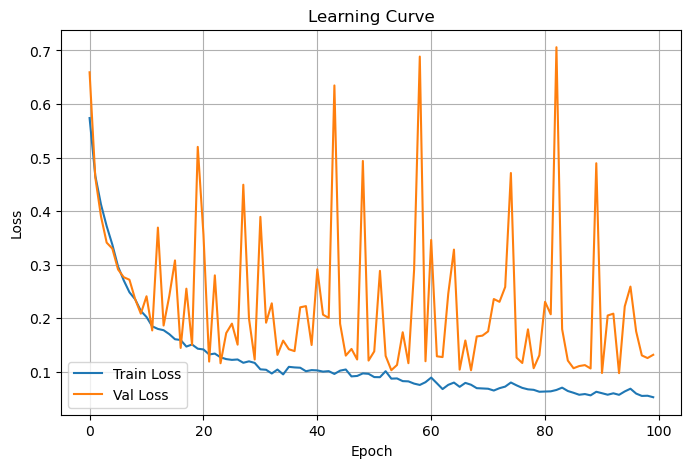

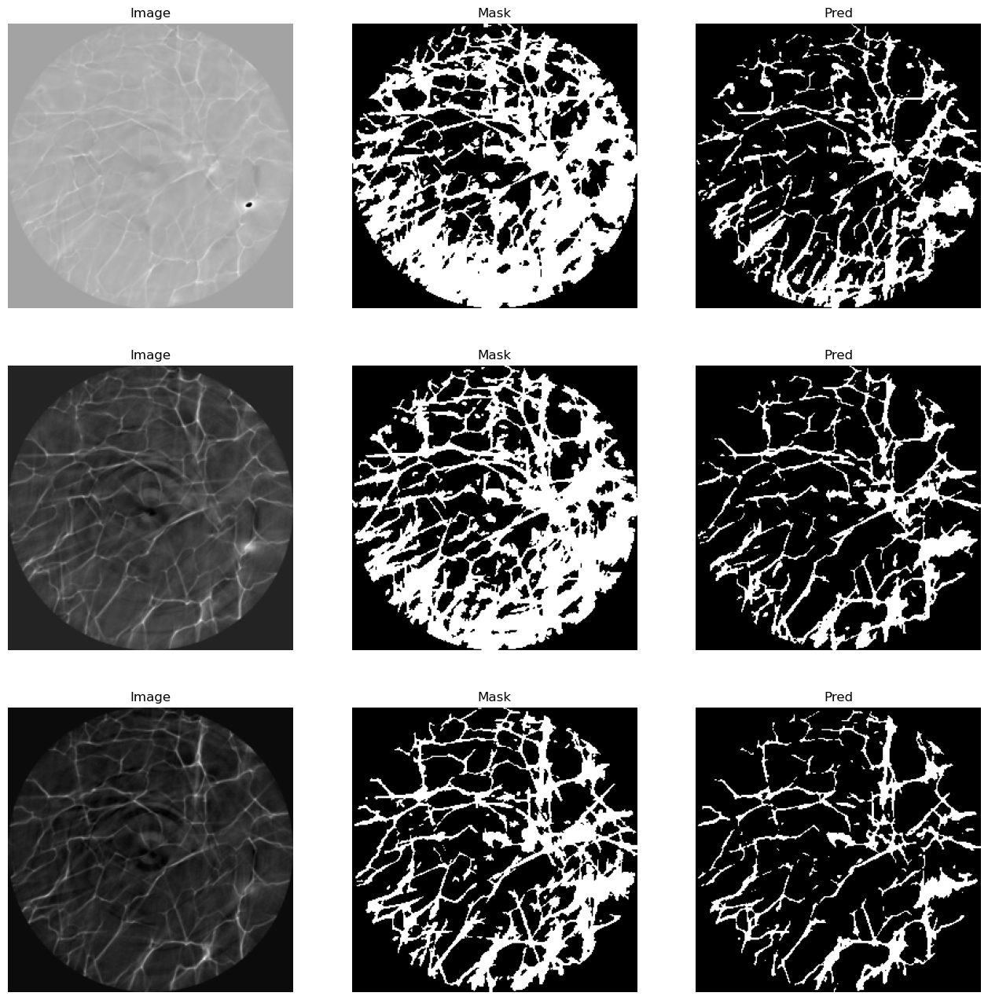

In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

model.eval()
with torch.no_grad():
    imgs, masks = next(iter(test_loader))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste_li.png", bbox_inches='tight', dpi = 300)

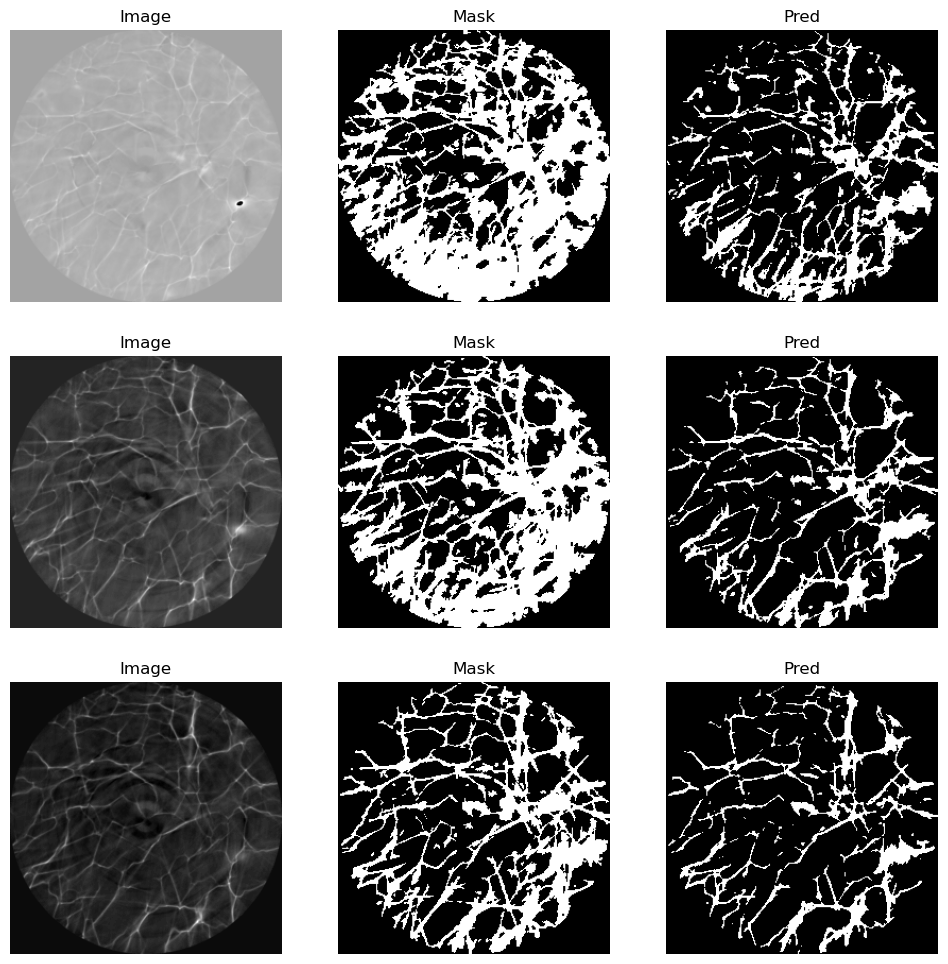

In [24]:
fig, axes = plt.subplots(3,3, figsize=(12,12))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")
plt.show()

In [25]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Acurácia: 0.8280372619628906
Precisão: 0.9998
Recall: 0.4802
F1-score: 0.6488


Apesar dos scores de precisão terem sido tão ruins, podemos ver que, em alguns casos, as predições feitas pela rede foram ainda melhores do que as originais, que acabaram considerando uma grande região da parte inferior do tomograma como se fossem nanofibrilas.

- Aumentar a resolução da imagem inicial tem alguma diferença?

In [26]:
transform_HQ = transforms.Compose([
    transforms.Resize((512,512)),
    transforms.ToTensor(),
])

train_dataset_HQ = TomoDataset("/mnt/bgfs/projects/tomo_nano/joana/data/train_data/images_100", "/mnt/bgfs/projects/tomo_nano/joana/data/train_data/masks_100", transform=transform_HQ)

In [27]:
val_ratio = 0.1
n_total = len(train_dataset_HQ)
n_val = int(n_total * val_ratio)
n_train = n_total - n_val

train_ds_HQ, val_ds_HQ = random_split(train_dataset_HQ, [n_train, n_val])

train_loader_HQ = DataLoader(train_ds_HQ, batch_size=4, shuffle=True)
val_loader_HQ = DataLoader(val_ds_HQ, batch_size=4, shuffle=False)

print(f"Train: {len(train_ds_HQ)}, Val: {len(val_ds_HQ)}")

Train: 90, Val: 10


  1%|          | 1/100 [00:16<27:55, 16.92s/it]

Epoch 1/100 - Train Loss: 0.5460 - Val Loss: 0.6928


  2%|▏         | 2/100 [00:32<26:13, 16.06s/it]

Epoch 2/100 - Train Loss: 0.4347 - Val Loss: 0.4726


  3%|▎         | 3/100 [00:47<25:01, 15.48s/it]

Epoch 3/100 - Train Loss: 0.3842 - Val Loss: 0.4113


  4%|▍         | 4/100 [01:02<24:22, 15.24s/it]

Epoch 4/100 - Train Loss: 0.3459 - Val Loss: 0.5056


  5%|▌         | 5/100 [01:17<24:04, 15.20s/it]

Epoch 5/100 - Train Loss: 0.3088 - Val Loss: 0.5839


  6%|▌         | 6/100 [01:32<23:49, 15.21s/it]

Epoch 6/100 - Train Loss: 0.2837 - Val Loss: 0.2911


  7%|▋         | 7/100 [01:47<23:35, 15.22s/it]

Epoch 7/100 - Train Loss: 0.2546 - Val Loss: 0.3333


  8%|▊         | 8/100 [02:02<23:03, 15.04s/it]

Epoch 8/100 - Train Loss: 0.2310 - Val Loss: 0.2922


  9%|▉         | 9/100 [02:16<22:36, 14.91s/it]

Epoch 9/100 - Train Loss: 0.2122 - Val Loss: 0.3427


 10%|█         | 10/100 [02:31<22:25, 14.95s/it]

Epoch 10/100 - Train Loss: 0.1970 - Val Loss: 0.2696


 11%|█         | 11/100 [02:47<22:16, 15.02s/it]

Epoch 11/100 - Train Loss: 0.1863 - Val Loss: 0.2033


 12%|█▏        | 12/100 [03:02<22:07, 15.08s/it]

Epoch 12/100 - Train Loss: 0.1770 - Val Loss: 0.2946


 13%|█▎        | 13/100 [03:17<21:47, 15.03s/it]

Epoch 13/100 - Train Loss: 0.1674 - Val Loss: 0.2589


 14%|█▍        | 14/100 [03:32<21:27, 14.97s/it]

Epoch 14/100 - Train Loss: 0.1673 - Val Loss: 0.1615


 15%|█▌        | 15/100 [03:46<21:04, 14.88s/it]

Epoch 15/100 - Train Loss: 0.1566 - Val Loss: 0.3731


 16%|█▌        | 16/100 [04:01<20:41, 14.78s/it]

Epoch 16/100 - Train Loss: 0.1522 - Val Loss: 0.1911


 17%|█▋        | 17/100 [04:16<20:28, 14.81s/it]

Epoch 17/100 - Train Loss: 0.1492 - Val Loss: 0.4009


 18%|█▊        | 18/100 [04:31<20:22, 14.91s/it]

Epoch 18/100 - Train Loss: 0.1441 - Val Loss: 0.2162


 19%|█▉        | 19/100 [04:45<19:59, 14.81s/it]

Epoch 19/100 - Train Loss: 0.1482 - Val Loss: 0.8802


 20%|██        | 20/100 [05:00<19:47, 14.84s/it]

Epoch 20/100 - Train Loss: 0.1415 - Val Loss: 0.1925


 21%|██        | 21/100 [05:15<19:34, 14.87s/it]

Epoch 21/100 - Train Loss: 0.1440 - Val Loss: 0.1901


 22%|██▏       | 22/100 [05:30<19:23, 14.92s/it]

Epoch 22/100 - Train Loss: 0.1374 - Val Loss: 0.1334


 23%|██▎       | 23/100 [05:45<19:06, 14.89s/it]

Epoch 23/100 - Train Loss: 0.1380 - Val Loss: 0.1822


 24%|██▍       | 24/100 [06:00<18:48, 14.85s/it]

Epoch 24/100 - Train Loss: 0.1311 - Val Loss: 0.2651


 25%|██▌       | 25/100 [06:15<18:44, 14.99s/it]

Epoch 25/100 - Train Loss: 0.1365 - Val Loss: 0.1375


 26%|██▌       | 26/100 [06:30<18:25, 14.94s/it]

Epoch 26/100 - Train Loss: 0.1334 - Val Loss: 0.2200


 27%|██▋       | 27/100 [06:45<18:12, 14.97s/it]

Epoch 27/100 - Train Loss: 0.1300 - Val Loss: 0.4863


 28%|██▊       | 28/100 [07:00<17:47, 14.83s/it]

Epoch 28/100 - Train Loss: 0.1273 - Val Loss: 0.1806


 29%|██▉       | 29/100 [07:14<17:23, 14.70s/it]

Epoch 29/100 - Train Loss: 0.1370 - Val Loss: 0.1607


 30%|███       | 30/100 [07:29<17:15, 14.79s/it]

Epoch 30/100 - Train Loss: 0.1361 - Val Loss: 0.3334


 31%|███       | 31/100 [07:44<17:06, 14.87s/it]

Epoch 31/100 - Train Loss: 0.1318 - Val Loss: 0.2984


 32%|███▏      | 32/100 [07:59<16:51, 14.88s/it]

Epoch 32/100 - Train Loss: 0.1332 - Val Loss: 0.4650


 33%|███▎      | 33/100 [08:14<16:33, 14.83s/it]

Epoch 33/100 - Train Loss: 0.1307 - Val Loss: 0.1824


 34%|███▍      | 34/100 [08:28<16:18, 14.82s/it]

Epoch 34/100 - Train Loss: 0.1254 - Val Loss: 0.2859


 35%|███▌      | 35/100 [08:44<16:09, 14.91s/it]

Epoch 35/100 - Train Loss: 0.1348 - Val Loss: 0.2514


 36%|███▌      | 36/100 [08:58<15:47, 14.80s/it]

Epoch 36/100 - Train Loss: 0.1307 - Val Loss: 0.9622


 37%|███▋      | 37/100 [09:13<15:40, 14.93s/it]

Epoch 37/100 - Train Loss: 0.1268 - Val Loss: 0.2080


 38%|███▊      | 38/100 [09:28<15:22, 14.88s/it]

Epoch 38/100 - Train Loss: 0.1274 - Val Loss: 0.3192


 39%|███▉      | 39/100 [09:42<14:58, 14.72s/it]

Epoch 39/100 - Train Loss: 0.1275 - Val Loss: 0.2864


 40%|████      | 40/100 [09:57<14:38, 14.64s/it]

Epoch 40/100 - Train Loss: 0.1256 - Val Loss: 0.6100


 41%|████      | 41/100 [10:12<14:29, 14.74s/it]

Epoch 41/100 - Train Loss: 0.1267 - Val Loss: 0.4117


 42%|████▏     | 42/100 [10:26<14:09, 14.64s/it]

Epoch 42/100 - Train Loss: 0.1229 - Val Loss: 0.3340


 43%|████▎     | 43/100 [10:41<14:02, 14.78s/it]

Epoch 43/100 - Train Loss: 0.1225 - Val Loss: 0.6605


 44%|████▍     | 44/100 [10:56<13:44, 14.72s/it]

Epoch 44/100 - Train Loss: 0.1247 - Val Loss: 0.5489


 45%|████▌     | 45/100 [11:11<13:29, 14.72s/it]

Epoch 45/100 - Train Loss: 0.1190 - Val Loss: 0.1470


 46%|████▌     | 46/100 [11:26<13:20, 14.82s/it]

Epoch 46/100 - Train Loss: 0.1215 - Val Loss: 0.1439


 47%|████▋     | 47/100 [11:41<13:06, 14.84s/it]

Epoch 47/100 - Train Loss: 0.1204 - Val Loss: 0.1524


 48%|████▊     | 48/100 [11:56<12:59, 14.99s/it]

Epoch 48/100 - Train Loss: 0.1259 - Val Loss: 0.1243


 49%|████▉     | 49/100 [12:11<12:44, 14.99s/it]

Epoch 49/100 - Train Loss: 0.1202 - Val Loss: 0.2429


 50%|█████     | 50/100 [12:26<12:30, 15.01s/it]

Epoch 50/100 - Train Loss: 0.1218 - Val Loss: 0.2063


 51%|█████     | 51/100 [12:41<12:14, 15.00s/it]

Epoch 51/100 - Train Loss: 0.1234 - Val Loss: 0.1681


 52%|█████▏    | 52/100 [12:56<11:59, 14.99s/it]

Epoch 52/100 - Train Loss: 0.1194 - Val Loss: 0.4443


 53%|█████▎    | 53/100 [13:11<11:51, 15.14s/it]

Epoch 53/100 - Train Loss: 0.1250 - Val Loss: 0.1621


 54%|█████▍    | 54/100 [13:26<11:31, 15.03s/it]

Epoch 54/100 - Train Loss: 0.1230 - Val Loss: 0.2741


 55%|█████▌    | 55/100 [13:41<11:11, 14.92s/it]

Epoch 55/100 - Train Loss: 0.1226 - Val Loss: 0.1261


 56%|█████▌    | 56/100 [13:56<10:53, 14.85s/it]

Epoch 56/100 - Train Loss: 0.1230 - Val Loss: 0.1322


 57%|█████▋    | 57/100 [14:10<10:33, 14.72s/it]

Epoch 57/100 - Train Loss: 0.1226 - Val Loss: 1.3788


 58%|█████▊    | 58/100 [14:25<10:23, 14.85s/it]

Epoch 58/100 - Train Loss: 0.1273 - Val Loss: 0.2395


 59%|█████▉    | 59/100 [14:41<10:16, 15.04s/it]

Epoch 59/100 - Train Loss: 0.1213 - Val Loss: 0.1982


 60%|██████    | 60/100 [14:55<09:58, 14.97s/it]

Epoch 60/100 - Train Loss: 0.1202 - Val Loss: 0.2559


 61%|██████    | 61/100 [15:11<09:45, 15.01s/it]

Epoch 61/100 - Train Loss: 0.1210 - Val Loss: 0.1214


 62%|██████▏   | 62/100 [15:25<09:28, 14.95s/it]

Epoch 62/100 - Train Loss: 0.1154 - Val Loss: 0.1370


 63%|██████▎   | 63/100 [15:40<09:12, 14.94s/it]

Epoch 63/100 - Train Loss: 0.1175 - Val Loss: 0.2571


 64%|██████▍   | 64/100 [15:55<09:00, 15.02s/it]

Epoch 64/100 - Train Loss: 0.1224 - Val Loss: 0.2600


 65%|██████▌   | 65/100 [16:10<08:42, 14.92s/it]

Epoch 65/100 - Train Loss: 0.1199 - Val Loss: 0.2519


 66%|██████▌   | 66/100 [16:26<08:35, 15.16s/it]

Epoch 66/100 - Train Loss: 0.1190 - Val Loss: 0.1199


 67%|██████▋   | 67/100 [16:40<08:12, 14.91s/it]

Epoch 67/100 - Train Loss: 0.1171 - Val Loss: 0.8022


 68%|██████▊   | 68/100 [16:55<07:53, 14.79s/it]

Epoch 68/100 - Train Loss: 0.1189 - Val Loss: 0.2055


 69%|██████▉   | 69/100 [17:09<07:35, 14.68s/it]

Epoch 69/100 - Train Loss: 0.1131 - Val Loss: 0.1257


 70%|███████   | 70/100 [17:24<07:20, 14.69s/it]

Epoch 70/100 - Train Loss: 0.1213 - Val Loss: 0.1568


 71%|███████   | 71/100 [17:39<07:07, 14.73s/it]

Epoch 71/100 - Train Loss: 0.1149 - Val Loss: 0.1269


 72%|███████▏  | 72/100 [17:53<06:52, 14.74s/it]

Epoch 72/100 - Train Loss: 0.1151 - Val Loss: 0.1422


 73%|███████▎  | 73/100 [18:08<06:37, 14.73s/it]

Epoch 73/100 - Train Loss: 0.1138 - Val Loss: 0.1562


 74%|███████▍  | 74/100 [18:23<06:20, 14.64s/it]

Epoch 74/100 - Train Loss: 0.1119 - Val Loss: 0.1566


 75%|███████▌  | 75/100 [18:37<06:05, 14.61s/it]

Epoch 75/100 - Train Loss: 0.1168 - Val Loss: 0.1389


 76%|███████▌  | 76/100 [18:51<05:48, 14.52s/it]

Epoch 76/100 - Train Loss: 0.1088 - Val Loss: 0.4178


 77%|███████▋  | 77/100 [19:07<05:38, 14.70s/it]

Epoch 77/100 - Train Loss: 0.1104 - Val Loss: 0.3439


 78%|███████▊  | 78/100 [19:21<05:24, 14.74s/it]

Epoch 78/100 - Train Loss: 0.1160 - Val Loss: 0.9062


 79%|███████▉  | 79/100 [19:36<05:10, 14.80s/it]

Epoch 79/100 - Train Loss: 0.1123 - Val Loss: 0.1624


 80%|████████  | 80/100 [19:51<04:56, 14.83s/it]

Epoch 80/100 - Train Loss: 0.1073 - Val Loss: 0.1942


 81%|████████  | 81/100 [20:06<04:41, 14.82s/it]

Epoch 81/100 - Train Loss: 0.1075 - Val Loss: 0.1560


 82%|████████▏ | 82/100 [20:21<04:25, 14.74s/it]

Epoch 82/100 - Train Loss: 0.1065 - Val Loss: 0.1356


 83%|████████▎ | 83/100 [20:35<04:07, 14.59s/it]

Epoch 83/100 - Train Loss: 0.1131 - Val Loss: 0.3201


 84%|████████▍ | 84/100 [20:49<03:52, 14.56s/it]

Epoch 84/100 - Train Loss: 0.1049 - Val Loss: 0.2679


 85%|████████▌ | 85/100 [21:04<03:38, 14.58s/it]

Epoch 85/100 - Train Loss: 0.1020 - Val Loss: 0.1694


 86%|████████▌ | 86/100 [21:19<03:27, 14.84s/it]

Epoch 86/100 - Train Loss: 0.1011 - Val Loss: 0.1326


 87%|████████▋ | 87/100 [21:34<03:13, 14.91s/it]

Epoch 87/100 - Train Loss: 0.1031 - Val Loss: 0.2342


 88%|████████▊ | 88/100 [21:50<02:59, 14.99s/it]

Epoch 88/100 - Train Loss: 0.1054 - Val Loss: 0.1285


 89%|████████▉ | 89/100 [22:04<02:43, 14.89s/it]

Epoch 89/100 - Train Loss: 0.0967 - Val Loss: 0.1642


 90%|█████████ | 90/100 [22:19<02:29, 14.94s/it]

Epoch 90/100 - Train Loss: 0.0970 - Val Loss: 0.1633


 91%|█████████ | 91/100 [22:35<02:15, 15.02s/it]

Epoch 91/100 - Train Loss: 0.1003 - Val Loss: 0.2788


 92%|█████████▏| 92/100 [22:49<02:00, 15.01s/it]

Epoch 92/100 - Train Loss: 0.0960 - Val Loss: 0.4297


 93%|█████████▎| 93/100 [23:04<01:44, 14.86s/it]

Epoch 93/100 - Train Loss: 0.1053 - Val Loss: 0.2110


 94%|█████████▍| 94/100 [23:19<01:28, 14.81s/it]

Epoch 94/100 - Train Loss: 0.0947 - Val Loss: 0.1641


 95%|█████████▌| 95/100 [23:34<01:14, 14.87s/it]

Epoch 95/100 - Train Loss: 0.0883 - Val Loss: 0.1965


 96%|█████████▌| 96/100 [23:49<00:59, 14.94s/it]

Epoch 96/100 - Train Loss: 0.0914 - Val Loss: 0.1358


 97%|█████████▋| 97/100 [24:04<00:45, 15.07s/it]

Epoch 97/100 - Train Loss: 0.0904 - Val Loss: 0.3189


 98%|█████████▊| 98/100 [24:19<00:29, 14.90s/it]

Epoch 98/100 - Train Loss: 0.0983 - Val Loss: 0.1805


 99%|█████████▉| 99/100 [24:33<00:14, 14.86s/it]

Epoch 99/100 - Train Loss: 0.0902 - Val Loss: 0.2512


100%|██████████| 100/100 [24:48<00:00, 14.89s/it]

Epoch 100/100 - Train Loss: 0.0852 - Val Loss: 0.1429


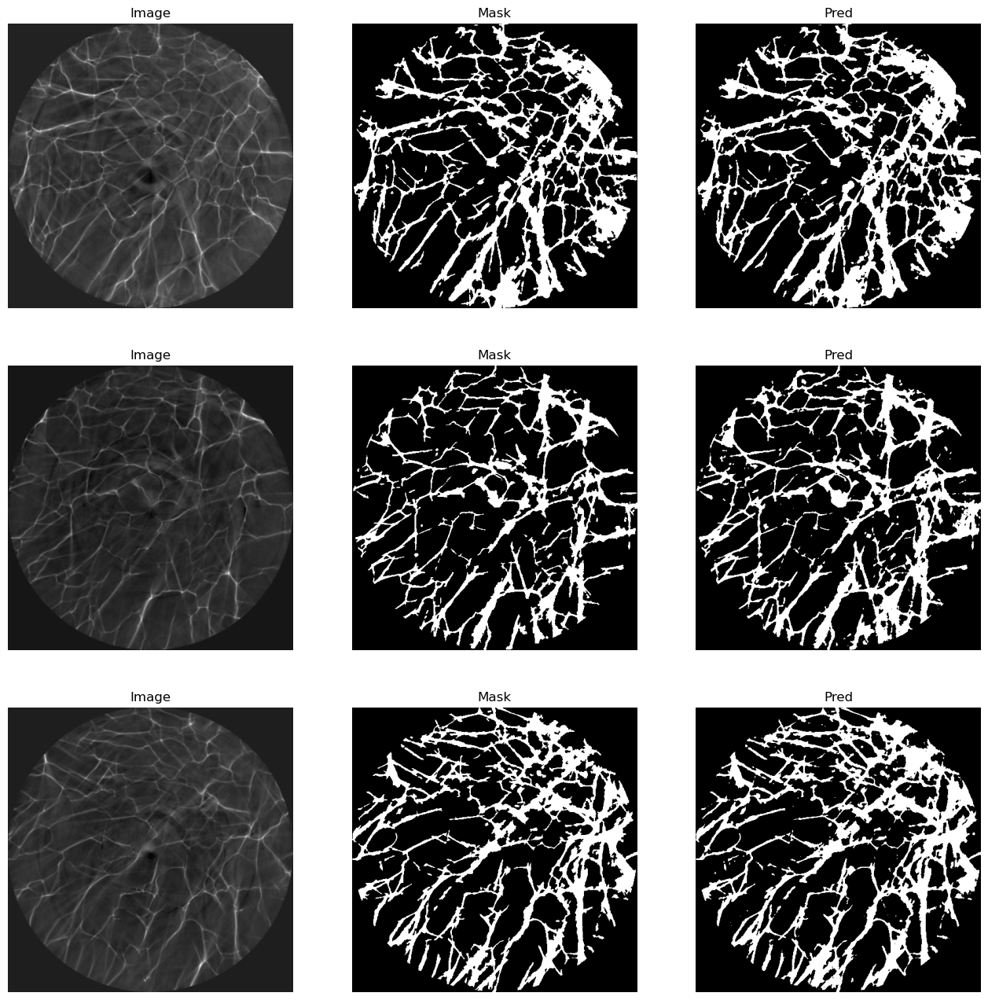

In [28]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader_HQ):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader_HQ)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader_HQ:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader_HQ)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

model.eval()
with torch.no_grad():
    imgs, masks = next(iter(train_loader_HQ))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste_HQ.png", bbox_inches='tight', dpi = 300)

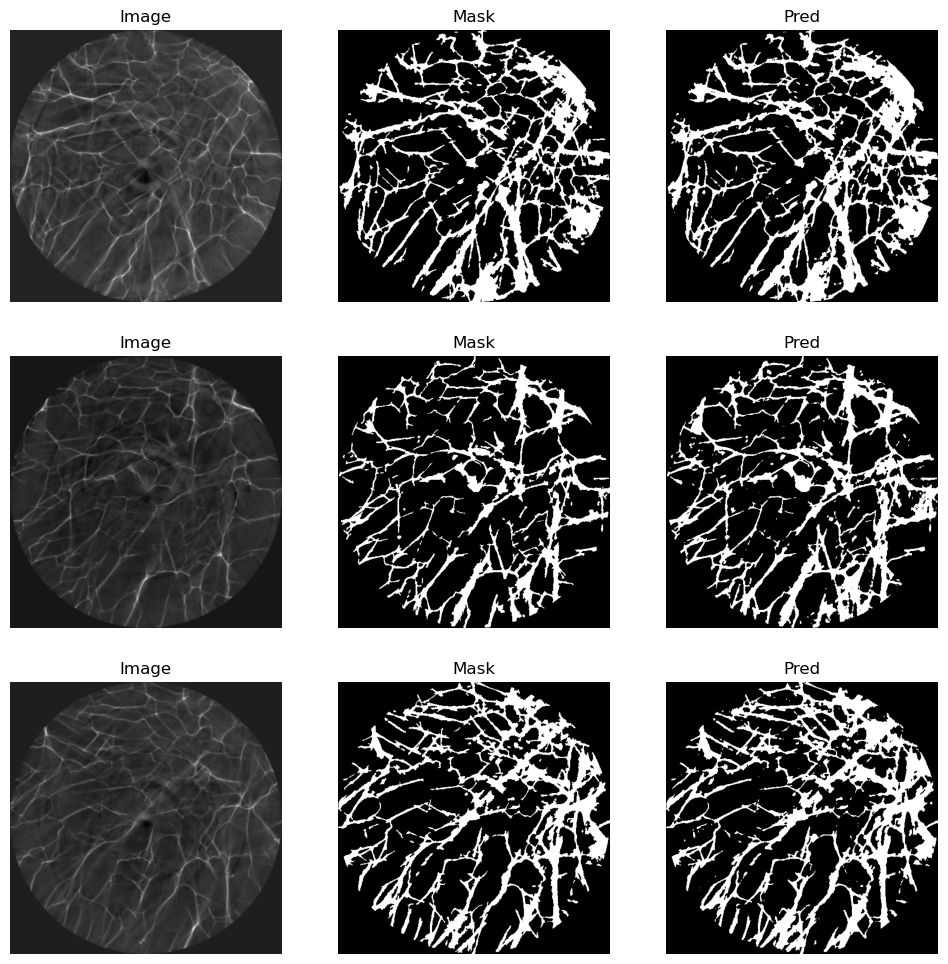

In [29]:
fig, axes = plt.subplots(3,3, figsize=(12,12))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")
plt.show()

In [30]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Acurácia: 0.9606132507324219
Precisão: 0.8692
Recall: 0.9765
F1-score: 0.9197


**Qualitativamente, as reconstruções ficaram melhores quando utilizamos imagens de maior resolução como entrada. Porém, os scores indicam que com a qualidade padrão (256x256) se saíram melhor.**

- Opicional / bonus: Qual a melhor estratégia? Mais imagens, rede neural maior e mais profunda ou imagens melhores?

**Acredito que uma junção dos dois. Redes neurais com mais dados de treinamento se saíram melhor, e quando o input são imagens de maior qualidade, visualmente as reconstruções foram mais precisas. Não sabemos quanto a redes mais profundas, pois nem eu nem a yasmin chegamos a mudar o número de camadas da rede. Aparentemente, a melhor função de ativação é a LeakyRelu (não testei, mas segundo a yas é melhor), o melhor otimizador é o Adam, a melhor distribuição de dados é 0.9-0.1 (90% para treinamento e 10% para validação), taxa de aprendizado de 1e-3, e a máscara otsu se saiu melhor do que a li.**
* aumentar as camadas e neuronios da rede;
* aumentar o dataloader de entrada da rede (150 - 200 imagens de entrada).
* aumentar a qualidade das imagens de entrada.

In [14]:
"""DataLoader com 150 imagens de entrada"""

train_dataset_150 = TomoDataset("/mnt/bgfs/projects/tomo_nano/joana/data/train_data/images_150", "/mnt/bgfs/projects/tomo_nano/joana/data/train_data/masks_150", transform=transform)

val_ratio = 0.1
n_total_150 = len(train_dataset_150)
n_val_150 = int(n_total_150 * val_ratio)
n_train_150 = n_total_150 - n_val_150

train_ds_150, val_ds_150 = random_split(train_dataset_150, [n_train_150, n_val_150])

train_loader_150 = DataLoader(train_ds_150, batch_size=4, shuffle=True)
val_loader_150 = DataLoader(val_ds_150, batch_size=4, shuffle=False)

print(f"Train: {len(train_ds_150)}, Val: {len(val_ds_150)}")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet().to(device)
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

Train: 135, Val: 15


  1%|          | 1/100 [00:10<17:32, 10.63s/it]

Epoch 1/100 - Train Loss: 0.5372 - Val Loss: 0.5726


  2%|▏         | 2/100 [00:18<14:46,  9.05s/it]

Epoch 2/100 - Train Loss: 0.4043 - Val Loss: 0.4090


  3%|▎         | 3/100 [00:26<13:46,  8.52s/it]

Epoch 3/100 - Train Loss: 0.3336 - Val Loss: 0.3612


  4%|▍         | 4/100 [00:34<13:12,  8.25s/it]

Epoch 4/100 - Train Loss: 0.2774 - Val Loss: 0.3527


  5%|▌         | 5/100 [00:42<12:52,  8.13s/it]

Epoch 5/100 - Train Loss: 0.2419 - Val Loss: 0.5381


  6%|▌         | 6/100 [00:50<12:39,  8.08s/it]

Epoch 6/100 - Train Loss: 0.2111 - Val Loss: 0.2954


  7%|▋         | 7/100 [00:58<12:23,  7.99s/it]

Epoch 7/100 - Train Loss: 0.1862 - Val Loss: 0.6240


  8%|▊         | 8/100 [01:05<12:09,  7.93s/it]

Epoch 8/100 - Train Loss: 0.1719 - Val Loss: 0.1611


  9%|▉         | 9/100 [01:13<11:58,  7.90s/it]

Epoch 9/100 - Train Loss: 0.1570 - Val Loss: 0.1766


 10%|█         | 10/100 [01:21<11:49,  7.88s/it]

Epoch 10/100 - Train Loss: 0.1562 - Val Loss: 0.1580


 11%|█         | 11/100 [01:29<11:40,  7.87s/it]

Epoch 11/100 - Train Loss: 0.1431 - Val Loss: 0.6068


 12%|█▏        | 12/100 [01:37<11:31,  7.86s/it]

Epoch 12/100 - Train Loss: 0.1395 - Val Loss: 0.1425


 13%|█▎        | 13/100 [01:44<11:22,  7.84s/it]

Epoch 13/100 - Train Loss: 0.1304 - Val Loss: 0.4900


 14%|█▍        | 14/100 [01:53<11:21,  7.92s/it]

Epoch 14/100 - Train Loss: 0.1285 - Val Loss: 0.2126


 15%|█▌        | 15/100 [02:00<11:11,  7.90s/it]

Epoch 15/100 - Train Loss: 0.1239 - Val Loss: 0.1467


 16%|█▌        | 16/100 [02:08<11:02,  7.88s/it]

Epoch 16/100 - Train Loss: 0.1236 - Val Loss: 0.1369


 17%|█▋        | 17/100 [02:17<11:10,  8.08s/it]

Epoch 17/100 - Train Loss: 0.1200 - Val Loss: 0.2047


 18%|█▊        | 18/100 [02:25<10:56,  8.00s/it]

Epoch 18/100 - Train Loss: 0.1176 - Val Loss: 0.2261


 19%|█▉        | 19/100 [02:32<10:43,  7.94s/it]

Epoch 19/100 - Train Loss: 0.1255 - Val Loss: 0.4140


 20%|██        | 20/100 [02:40<10:31,  7.90s/it]

Epoch 20/100 - Train Loss: 0.1230 - Val Loss: 0.2503


 21%|██        | 21/100 [02:48<10:21,  7.87s/it]

Epoch 21/100 - Train Loss: 0.1257 - Val Loss: 0.2100


 22%|██▏       | 22/100 [02:56<10:13,  7.87s/it]

Epoch 22/100 - Train Loss: 0.1159 - Val Loss: 1.0001


 23%|██▎       | 23/100 [03:04<10:07,  7.88s/it]

Epoch 23/100 - Train Loss: 0.1124 - Val Loss: 0.1628


 24%|██▍       | 24/100 [03:12<09:58,  7.88s/it]

Epoch 24/100 - Train Loss: 0.1040 - Val Loss: 0.9189


 25%|██▌       | 25/100 [03:20<09:52,  7.90s/it]

Epoch 25/100 - Train Loss: 0.1096 - Val Loss: 0.1531


 26%|██▌       | 26/100 [03:28<09:58,  8.09s/it]

Epoch 26/100 - Train Loss: 0.1046 - Val Loss: 0.1976


 27%|██▋       | 27/100 [03:36<09:44,  8.01s/it]

Epoch 27/100 - Train Loss: 0.1003 - Val Loss: 0.4199


 28%|██▊       | 28/100 [03:44<09:33,  7.97s/it]

Epoch 28/100 - Train Loss: 0.1176 - Val Loss: 0.1469


 29%|██▉       | 29/100 [03:52<09:23,  7.93s/it]

Epoch 29/100 - Train Loss: 0.1000 - Val Loss: 0.1410


 30%|███       | 30/100 [04:00<09:19,  7.99s/it]

Epoch 30/100 - Train Loss: 0.1032 - Val Loss: 0.2889


 31%|███       | 31/100 [04:08<09:17,  8.08s/it]

Epoch 31/100 - Train Loss: 0.0960 - Val Loss: 0.1513


 32%|███▏      | 32/100 [04:16<09:08,  8.07s/it]

Epoch 32/100 - Train Loss: 0.0960 - Val Loss: 0.1398


 33%|███▎      | 33/100 [04:24<08:55,  7.99s/it]

Epoch 33/100 - Train Loss: 0.0881 - Val Loss: 0.1887


 34%|███▍      | 34/100 [04:32<08:45,  7.96s/it]

Epoch 34/100 - Train Loss: 0.1013 - Val Loss: 0.1287


 35%|███▌      | 35/100 [04:40<08:34,  7.91s/it]

Epoch 35/100 - Train Loss: 0.0872 - Val Loss: 0.2571


 36%|███▌      | 36/100 [04:47<08:24,  7.88s/it]

Epoch 36/100 - Train Loss: 0.0890 - Val Loss: 0.3760


 37%|███▋      | 37/100 [04:55<08:16,  7.88s/it]

Epoch 37/100 - Train Loss: 0.0905 - Val Loss: 0.3566


 38%|███▊      | 38/100 [05:04<08:15,  7.99s/it]

Epoch 38/100 - Train Loss: 0.0916 - Val Loss: 0.3859


 39%|███▉      | 39/100 [05:11<08:02,  7.91s/it]

Epoch 39/100 - Train Loss: 0.0823 - Val Loss: 0.1636


 40%|████      | 40/100 [05:19<07:59,  7.99s/it]

Epoch 40/100 - Train Loss: 0.0898 - Val Loss: 0.2058


 41%|████      | 41/100 [05:28<07:58,  8.11s/it]

Epoch 41/100 - Train Loss: 0.0900 - Val Loss: 0.1856


 42%|████▏     | 42/100 [05:36<07:43,  8.00s/it]

Epoch 42/100 - Train Loss: 0.0852 - Val Loss: 0.2332


 43%|████▎     | 43/100 [05:43<07:32,  7.93s/it]

Epoch 43/100 - Train Loss: 0.0826 - Val Loss: 0.1196


 44%|████▍     | 44/100 [05:51<07:22,  7.91s/it]

Epoch 44/100 - Train Loss: 0.0827 - Val Loss: 0.1194


 45%|████▌     | 45/100 [05:59<07:14,  7.89s/it]

Epoch 45/100 - Train Loss: 0.0862 - Val Loss: 0.3015


 46%|████▌     | 46/100 [06:07<07:04,  7.87s/it]

Epoch 46/100 - Train Loss: 0.0805 - Val Loss: 0.1970


 47%|████▋     | 47/100 [06:15<06:58,  7.89s/it]

Epoch 47/100 - Train Loss: 0.0807 - Val Loss: 0.1357


 48%|████▊     | 48/100 [06:23<06:49,  7.87s/it]

Epoch 48/100 - Train Loss: 0.0760 - Val Loss: 0.1515


 49%|████▉     | 49/100 [06:31<06:43,  7.92s/it]

Epoch 49/100 - Train Loss: 0.0751 - Val Loss: 1.6553


 50%|█████     | 50/100 [06:39<06:35,  7.90s/it]

Epoch 50/100 - Train Loss: 0.0764 - Val Loss: 0.2343


 51%|█████     | 51/100 [06:47<06:27,  7.92s/it]

Epoch 51/100 - Train Loss: 0.0765 - Val Loss: 0.2422


 52%|█████▏    | 52/100 [06:54<06:20,  7.93s/it]

Epoch 52/100 - Train Loss: 0.0742 - Val Loss: 0.4705


 53%|█████▎    | 53/100 [07:02<06:13,  7.96s/it]

Epoch 53/100 - Train Loss: 0.0770 - Val Loss: 0.1976


 54%|█████▍    | 54/100 [07:10<06:05,  7.95s/it]

Epoch 54/100 - Train Loss: 0.0816 - Val Loss: 0.1901


 55%|█████▌    | 55/100 [07:18<05:56,  7.93s/it]

Epoch 55/100 - Train Loss: 0.0741 - Val Loss: 0.2622


 56%|█████▌    | 56/100 [07:26<05:48,  7.92s/it]

Epoch 56/100 - Train Loss: 0.0757 - Val Loss: 0.3000


 57%|█████▋    | 57/100 [07:34<05:42,  7.97s/it]

Epoch 57/100 - Train Loss: 0.0792 - Val Loss: 0.2774


 58%|█████▊    | 58/100 [07:43<05:45,  8.22s/it]

Epoch 58/100 - Train Loss: 0.0908 - Val Loss: 0.2920


 59%|█████▉    | 59/100 [07:52<05:42,  8.34s/it]

Epoch 59/100 - Train Loss: 0.0762 - Val Loss: 0.1282


 60%|██████    | 60/100 [08:00<05:36,  8.42s/it]

Epoch 60/100 - Train Loss: 0.0673 - Val Loss: 0.1520


 61%|██████    | 61/100 [08:09<05:27,  8.39s/it]

Epoch 61/100 - Train Loss: 0.0696 - Val Loss: 0.3213


 62%|██████▏   | 62/100 [08:16<05:12,  8.24s/it]

Epoch 62/100 - Train Loss: 0.0734 - Val Loss: 1.0609


 63%|██████▎   | 63/100 [08:25<05:03,  8.20s/it]

Epoch 63/100 - Train Loss: 0.0775 - Val Loss: 0.2154


 64%|██████▍   | 64/100 [08:32<04:51,  8.09s/it]

Epoch 64/100 - Train Loss: 0.0804 - Val Loss: 0.3855


 65%|██████▌   | 65/100 [08:40<04:42,  8.07s/it]

Epoch 65/100 - Train Loss: 0.0768 - Val Loss: 0.1657


 66%|██████▌   | 66/100 [08:48<04:31,  7.99s/it]

Epoch 66/100 - Train Loss: 0.0710 - Val Loss: 0.2130


 67%|██████▋   | 67/100 [08:56<04:21,  7.94s/it]

Epoch 67/100 - Train Loss: 0.0769 - Val Loss: 0.1521


 68%|██████▊   | 68/100 [09:05<04:21,  8.16s/it]

Epoch 68/100 - Train Loss: 0.0734 - Val Loss: 0.1513


 69%|██████▉   | 69/100 [09:13<04:12,  8.15s/it]

Epoch 69/100 - Train Loss: 0.0722 - Val Loss: 0.2214


 70%|███████   | 70/100 [09:21<04:04,  8.16s/it]

Epoch 70/100 - Train Loss: 0.0708 - Val Loss: 0.5645


 71%|███████   | 71/100 [09:29<03:57,  8.18s/it]

Epoch 71/100 - Train Loss: 0.0720 - Val Loss: 0.1701


 72%|███████▏  | 72/100 [09:38<03:49,  8.20s/it]

Epoch 72/100 - Train Loss: 0.0687 - Val Loss: 0.1504


 73%|███████▎  | 73/100 [09:47<03:47,  8.44s/it]

Epoch 73/100 - Train Loss: 0.0774 - Val Loss: 0.1281


 74%|███████▍  | 74/100 [09:56<03:43,  8.61s/it]

Epoch 74/100 - Train Loss: 0.0710 - Val Loss: 0.1391


 75%|███████▌  | 75/100 [10:05<03:39,  8.78s/it]

Epoch 75/100 - Train Loss: 0.0734 - Val Loss: 0.1261


 76%|███████▌  | 76/100 [10:13<03:29,  8.71s/it]

Epoch 76/100 - Train Loss: 0.0644 - Val Loss: 0.2162


 77%|███████▋  | 77/100 [10:21<03:16,  8.55s/it]

Epoch 77/100 - Train Loss: 0.0667 - Val Loss: 0.4094


 78%|███████▊  | 78/100 [10:29<03:03,  8.34s/it]

Epoch 78/100 - Train Loss: 0.0769 - Val Loss: 0.1452


 79%|███████▉  | 79/100 [10:37<02:51,  8.19s/it]

Epoch 79/100 - Train Loss: 0.0676 - Val Loss: 0.1036


 80%|████████  | 80/100 [10:45<02:41,  8.07s/it]

Epoch 80/100 - Train Loss: 0.0651 - Val Loss: 0.1241


 81%|████████  | 81/100 [10:53<02:32,  8.04s/it]

Epoch 81/100 - Train Loss: 0.0662 - Val Loss: 0.1253


 82%|████████▏ | 82/100 [11:01<02:23,  7.98s/it]

Epoch 82/100 - Train Loss: 0.0624 - Val Loss: 0.2460


 83%|████████▎ | 83/100 [11:09<02:14,  7.92s/it]

Epoch 83/100 - Train Loss: 0.0718 - Val Loss: 0.3582


 84%|████████▍ | 84/100 [11:16<02:06,  7.88s/it]

Epoch 84/100 - Train Loss: 0.0905 - Val Loss: 0.1185


 85%|████████▌ | 85/100 [11:24<01:58,  7.87s/it]

Epoch 85/100 - Train Loss: 0.0726 - Val Loss: 0.1438


 86%|████████▌ | 86/100 [11:32<01:49,  7.85s/it]

Epoch 86/100 - Train Loss: 0.0698 - Val Loss: 0.3740


 87%|████████▋ | 87/100 [11:40<01:41,  7.84s/it]

Epoch 87/100 - Train Loss: 0.0611 - Val Loss: 0.1199


 88%|████████▊ | 88/100 [11:48<01:34,  7.88s/it]

Epoch 88/100 - Train Loss: 0.0637 - Val Loss: 0.1771


 89%|████████▉ | 89/100 [11:56<01:26,  7.85s/it]

Epoch 89/100 - Train Loss: 0.0653 - Val Loss: 0.1529


 90%|█████████ | 90/100 [12:04<01:19,  7.95s/it]

Epoch 90/100 - Train Loss: 0.0623 - Val Loss: 0.1073


 91%|█████████ | 91/100 [12:12<01:11,  7.90s/it]

Epoch 91/100 - Train Loss: 0.0600 - Val Loss: 0.1485


 92%|█████████▏| 92/100 [12:19<01:02,  7.86s/it]

Epoch 92/100 - Train Loss: 0.0650 - Val Loss: 0.6271


 93%|█████████▎| 93/100 [12:27<00:54,  7.84s/it]

Epoch 93/100 - Train Loss: 0.0692 - Val Loss: 0.1279


 94%|█████████▍| 94/100 [12:35<00:47,  7.85s/it]

Epoch 94/100 - Train Loss: 0.0652 - Val Loss: 0.1150


 95%|█████████▌| 95/100 [12:43<00:39,  7.83s/it]

Epoch 95/100 - Train Loss: 0.0622 - Val Loss: 0.4299


 96%|█████████▌| 96/100 [12:51<00:31,  7.84s/it]

Epoch 96/100 - Train Loss: 0.0594 - Val Loss: 0.1083


 97%|█████████▋| 97/100 [12:58<00:23,  7.81s/it]

Epoch 97/100 - Train Loss: 0.0567 - Val Loss: 0.1150


 98%|█████████▊| 98/100 [13:06<00:15,  7.89s/it]

Epoch 98/100 - Train Loss: 0.0611 - Val Loss: 0.1517


 99%|█████████▉| 99/100 [13:14<00:07,  7.90s/it]

Epoch 99/100 - Train Loss: 0.0682 - Val Loss: 0.3004


100%|██████████| 100/100 [13:22<00:00,  8.03s/it]

Epoch 100/100 - Train Loss: 0.0677 - Val Loss: 0.1762


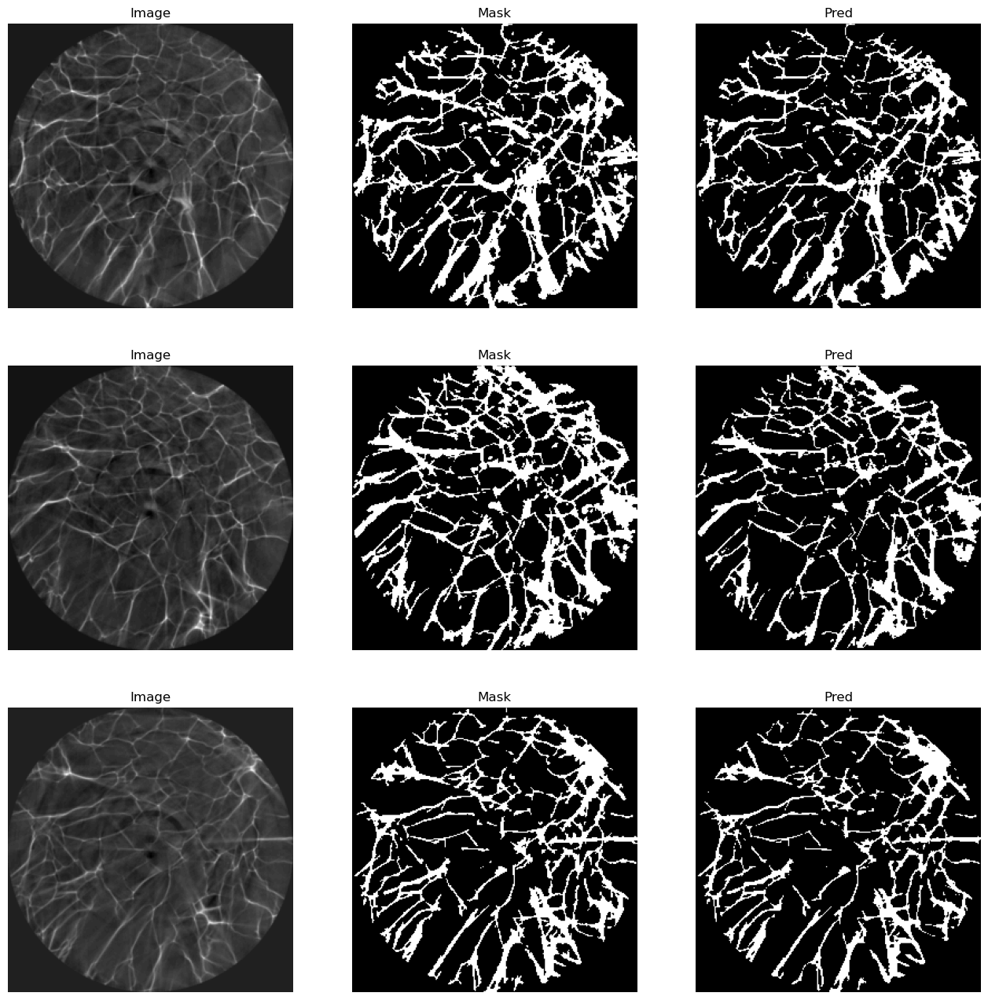

In [15]:
n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader_150):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader_150)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader_150:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader_150)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

model.eval()
with torch.no_grad():
    imgs, masks = next(iter(train_loader_150))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

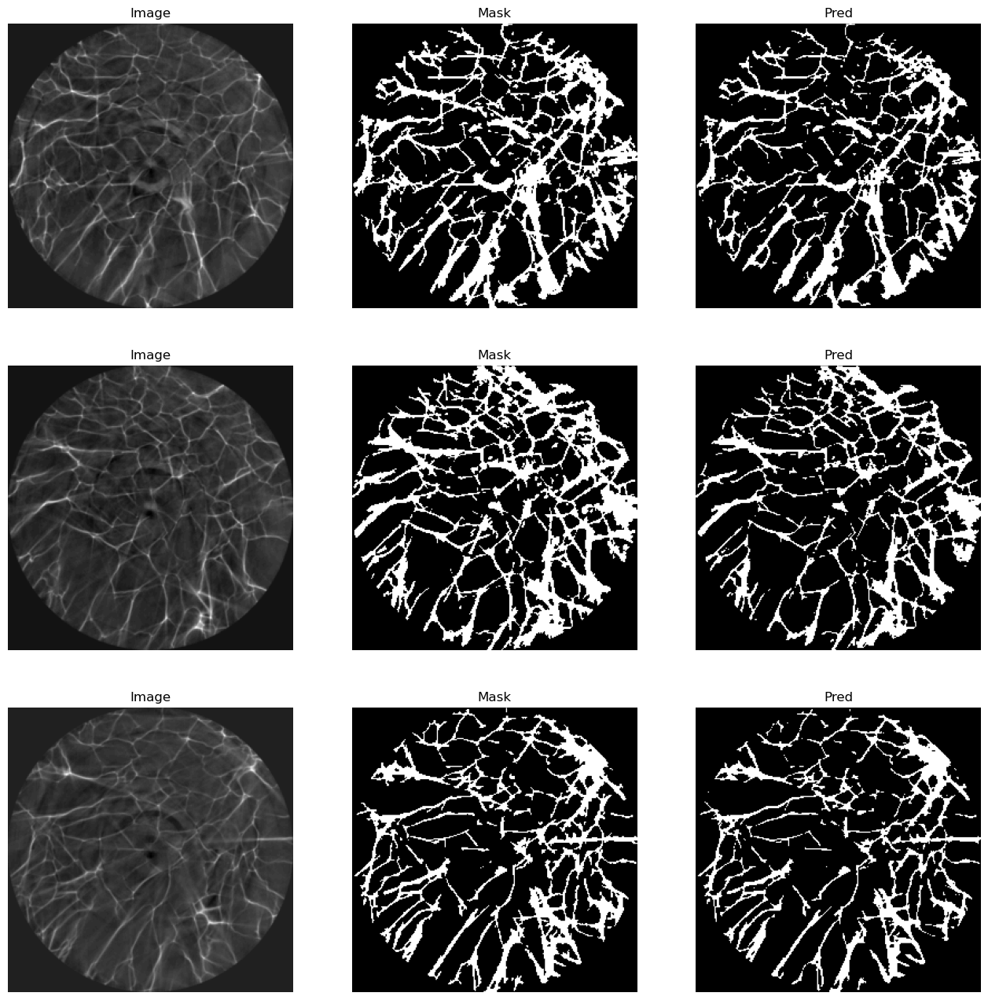

In [17]:
fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste_150input.png", bbox_inches='tight', dpi = 300)
plt.show()

In [18]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Acurácia: 0.9552879333496094
Precisão: 0.9841
Recall: 0.8115
F1-score: 0.8895


In [21]:
imgs, masks = next(iter(train_loader))
print("Shape das imagens:", imgs.shape)
print("Shape das máscaras:", masks.shape)

Shape das imagens: torch.Size([4, 1, 256, 256])
Shape das máscaras: torch.Size([4, 1, 256, 256])


In [23]:
h, w = imgs.shape[2], imgs.shape[3]
print("Altura:", h, "Largura:", w)

if h % 16 == 0 and w % 16 == 0:
    print("Dimensões válidas")
else:
    print("Dimensões NÃO compatíveis, pode dar erro no upsampling")

Altura: 256 Largura: 256
Dimensões válidas


In [24]:
"""Rede mais profunda (4 blocos de encoder)"""

class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels=1, n_classes=1):
        super().__init__()
        self.down1 = DoubleConv(n_channels, 16)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(16, 32)
        self.pool2 = nn.MaxPool2d(2)
        self.down3 = DoubleConv(32, 64)
        self.pool3 = nn.MaxPool2d(2)
        self.down4 = DoubleConv(64,128)
        self.pool4 = nn.MaxPool2d(2)

        self.middle = DoubleConv(128, 256)

        self.up4 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.conv4 = DoubleConv(256, 128)
        self.up3 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv3 = DoubleConv(128, 64)
        self.up2 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.conv2 = DoubleConv(64, 32)
        self.up1 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.conv1 = DoubleConv(32, 16)

        self.outc = nn.Conv2d(16, n_classes, 1)

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(self.pool1(d1))
        d3 = self.down3(self.pool2(d2))
        d4 = self.down4(self.pool3(d3))
        m = self.middle(self.pool4(d4))

        u4 = self.up4(m)
        u4 = self.conv4(torch.cat([u4, d4], dim=1))
        u3 = self.up3(u4)
        u3 = self.conv3(torch.cat([u3, d3], dim=1))
        u2 = self.up2(u3)
        u2 = self.conv2(torch.cat([u2, d2], dim=1))
        u1 = self.up1(u2)
        u1 = self.conv1(torch.cat([u1, d1], dim=1))
        return torch.sigmoid(self.outc(u1))

In [25]:
n_epochs = 100
train_losses, val_losses = [], []

for epoch in tqdm(range(n_epochs)):
    # ---- Training ----
    model.train()
    epoch_loss = 0
    for io, (imgs, masks) in enumerate(train_loader):
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    train_loss = epoch_loss / len(train_loader)
    
    # ---- Validation ----
    model.eval()
    running_val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            preds = model(imgs)
            val_loss = criterion(preds, masks)
            running_val_loss += val_loss.item()
    val_loss = running_val_loss / len(val_loader)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{n_epochs} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f}")

model.eval()
with torch.no_grad():
    imgs, masks = next(iter(train_loader))
    preds = model(imgs.to(device))
    preds = (preds > 0.5).float().cpu()

  1%|          | 1/100 [00:10<16:32, 10.02s/it]

Epoch 1/100 - Train Loss: 0.1174 - Val Loss: 0.2747


  2%|▏         | 2/100 [00:15<12:08,  7.43s/it]

Epoch 2/100 - Train Loss: 0.1123 - Val Loss: 0.5761


  3%|▎         | 3/100 [00:20<10:25,  6.44s/it]

Epoch 3/100 - Train Loss: 0.1020 - Val Loss: 0.1819


  4%|▍         | 4/100 [00:26<09:32,  5.96s/it]

Epoch 4/100 - Train Loss: 0.1006 - Val Loss: 0.2497


  5%|▌         | 5/100 [00:31<08:59,  5.68s/it]

Epoch 5/100 - Train Loss: 0.0934 - Val Loss: 0.8290


  6%|▌         | 6/100 [00:36<08:37,  5.51s/it]

Epoch 6/100 - Train Loss: 0.0874 - Val Loss: 0.2070


  7%|▋         | 7/100 [00:41<08:22,  5.41s/it]

Epoch 7/100 - Train Loss: 0.0818 - Val Loss: 0.3365


  8%|▊         | 8/100 [00:46<08:10,  5.33s/it]

Epoch 8/100 - Train Loss: 0.0902 - Val Loss: 0.3409


  9%|▉         | 9/100 [00:52<08:00,  5.29s/it]

Epoch 9/100 - Train Loss: 0.0755 - Val Loss: 0.3368


 10%|█         | 10/100 [00:57<07:53,  5.26s/it]

Epoch 10/100 - Train Loss: 0.0802 - Val Loss: 0.3210


 11%|█         | 11/100 [01:02<07:45,  5.22s/it]

Epoch 11/100 - Train Loss: 0.0722 - Val Loss: 0.2318


 12%|█▏        | 12/100 [01:07<07:38,  5.21s/it]

Epoch 12/100 - Train Loss: 0.0704 - Val Loss: 0.3693


 13%|█▎        | 13/100 [01:13<07:46,  5.37s/it]

Epoch 13/100 - Train Loss: 0.0653 - Val Loss: 0.1883


 14%|█▍        | 14/100 [01:18<07:37,  5.32s/it]

Epoch 14/100 - Train Loss: 0.0631 - Val Loss: 0.2318


 15%|█▌        | 15/100 [01:23<07:33,  5.33s/it]

Epoch 15/100 - Train Loss: 0.0695 - Val Loss: 0.4453


 16%|█▌        | 16/100 [01:29<07:26,  5.31s/it]

Epoch 16/100 - Train Loss: 0.0850 - Val Loss: 0.2704


 17%|█▋        | 17/100 [01:34<07:28,  5.40s/it]

Epoch 17/100 - Train Loss: 0.0704 - Val Loss: 0.2110


 18%|█▊        | 18/100 [01:39<07:17,  5.33s/it]

Epoch 18/100 - Train Loss: 0.0661 - Val Loss: 0.2814


 19%|█▉        | 19/100 [01:45<07:09,  5.30s/it]

Epoch 19/100 - Train Loss: 0.0654 - Val Loss: 0.2603


 20%|██        | 20/100 [01:50<07:05,  5.32s/it]

Epoch 20/100 - Train Loss: 0.0667 - Val Loss: 0.2411


 21%|██        | 21/100 [01:55<06:57,  5.28s/it]

Epoch 21/100 - Train Loss: 0.0680 - Val Loss: 0.1829


 22%|██▏       | 22/100 [02:00<06:49,  5.25s/it]

Epoch 22/100 - Train Loss: 0.0667 - Val Loss: 0.4710


 23%|██▎       | 23/100 [02:06<06:42,  5.22s/it]

Epoch 23/100 - Train Loss: 0.0639 - Val Loss: 0.5820


 24%|██▍       | 24/100 [02:11<06:36,  5.21s/it]

Epoch 24/100 - Train Loss: 0.0645 - Val Loss: 0.3316


 25%|██▌       | 25/100 [02:16<06:31,  5.22s/it]

Epoch 25/100 - Train Loss: 0.0597 - Val Loss: 0.4719


 26%|██▌       | 26/100 [02:21<06:25,  5.21s/it]

Epoch 26/100 - Train Loss: 0.0585 - Val Loss: 0.2209


 27%|██▋       | 27/100 [02:26<06:20,  5.21s/it]

Epoch 27/100 - Train Loss: 0.0547 - Val Loss: 0.2805


 28%|██▊       | 28/100 [02:32<06:14,  5.21s/it]

Epoch 28/100 - Train Loss: 0.0624 - Val Loss: 0.2425


 29%|██▉       | 29/100 [02:37<06:09,  5.20s/it]

Epoch 29/100 - Train Loss: 0.0587 - Val Loss: 0.3412


 30%|███       | 30/100 [02:42<06:04,  5.21s/it]

Epoch 30/100 - Train Loss: 0.0585 - Val Loss: 0.2788


 31%|███       | 31/100 [02:47<05:58,  5.20s/it]

Epoch 31/100 - Train Loss: 0.0581 - Val Loss: 0.2402


 32%|███▏      | 32/100 [02:52<05:53,  5.21s/it]

Epoch 32/100 - Train Loss: 0.0564 - Val Loss: 0.3467


 33%|███▎      | 33/100 [02:58<05:48,  5.20s/it]

Epoch 33/100 - Train Loss: 0.0552 - Val Loss: 0.2252


 34%|███▍      | 34/100 [03:03<05:43,  5.21s/it]

Epoch 34/100 - Train Loss: 0.0583 - Val Loss: 0.2656


 35%|███▌      | 35/100 [03:08<05:37,  5.20s/it]

Epoch 35/100 - Train Loss: 0.0555 - Val Loss: 0.2665


 36%|███▌      | 36/100 [03:13<05:32,  5.19s/it]

Epoch 36/100 - Train Loss: 0.0558 - Val Loss: 0.3043


 37%|███▋      | 37/100 [03:18<05:27,  5.21s/it]

Epoch 37/100 - Train Loss: 0.0578 - Val Loss: 0.3689


 38%|███▊      | 38/100 [03:24<05:22,  5.20s/it]

Epoch 38/100 - Train Loss: 0.0537 - Val Loss: 0.2407


 39%|███▉      | 39/100 [03:29<05:18,  5.22s/it]

Epoch 39/100 - Train Loss: 0.0521 - Val Loss: 0.2386


 40%|████      | 40/100 [03:34<05:14,  5.24s/it]

Epoch 40/100 - Train Loss: 0.0515 - Val Loss: 0.2563


 41%|████      | 41/100 [03:40<05:14,  5.33s/it]

Epoch 41/100 - Train Loss: 0.0510 - Val Loss: 0.3039


 42%|████▏     | 42/100 [03:45<05:07,  5.30s/it]

Epoch 42/100 - Train Loss: 0.0506 - Val Loss: 0.2342


 43%|████▎     | 43/100 [03:50<05:00,  5.27s/it]

Epoch 43/100 - Train Loss: 0.0525 - Val Loss: 0.3937


 44%|████▍     | 44/100 [03:55<04:57,  5.31s/it]

Epoch 44/100 - Train Loss: 0.0511 - Val Loss: 0.2539


 45%|████▌     | 45/100 [04:01<04:55,  5.37s/it]

Epoch 45/100 - Train Loss: 0.0526 - Val Loss: 0.2141


 46%|████▌     | 46/100 [04:06<04:47,  5.31s/it]

Epoch 46/100 - Train Loss: 0.0501 - Val Loss: 0.3856


 47%|████▋     | 47/100 [04:12<04:42,  5.33s/it]

Epoch 47/100 - Train Loss: 0.0498 - Val Loss: 0.5005


 48%|████▊     | 48/100 [04:17<04:37,  5.34s/it]

Epoch 48/100 - Train Loss: 0.0510 - Val Loss: 0.3675


 49%|████▉     | 49/100 [04:22<04:30,  5.31s/it]

Epoch 49/100 - Train Loss: 0.0578 - Val Loss: 0.3731


 50%|█████     | 50/100 [04:27<04:25,  5.31s/it]

Epoch 50/100 - Train Loss: 0.0546 - Val Loss: 0.2580


 51%|█████     | 51/100 [04:33<04:21,  5.34s/it]

Epoch 51/100 - Train Loss: 0.0556 - Val Loss: 0.2644


 52%|█████▏    | 52/100 [04:38<04:14,  5.31s/it]

Epoch 52/100 - Train Loss: 0.0607 - Val Loss: 0.5255


 53%|█████▎    | 53/100 [04:43<04:07,  5.28s/it]

Epoch 53/100 - Train Loss: 0.0596 - Val Loss: 0.2747


 54%|█████▍    | 54/100 [04:49<04:01,  5.26s/it]

Epoch 54/100 - Train Loss: 0.0614 - Val Loss: 0.3345


 55%|█████▌    | 55/100 [04:54<03:56,  5.25s/it]

Epoch 55/100 - Train Loss: 0.0555 - Val Loss: 0.2409


 56%|█████▌    | 56/100 [04:59<03:52,  5.29s/it]

Epoch 56/100 - Train Loss: 0.0552 - Val Loss: 0.5166


 57%|█████▋    | 57/100 [05:04<03:46,  5.28s/it]

Epoch 57/100 - Train Loss: 0.0588 - Val Loss: 0.3034


 58%|█████▊    | 58/100 [05:10<03:42,  5.31s/it]

Epoch 58/100 - Train Loss: 0.0559 - Val Loss: 0.4471


 59%|█████▉    | 59/100 [05:15<03:36,  5.27s/it]

Epoch 59/100 - Train Loss: 0.0533 - Val Loss: 0.4223


 60%|██████    | 60/100 [05:20<03:33,  5.33s/it]

Epoch 60/100 - Train Loss: 0.0521 - Val Loss: 0.4520


 61%|██████    | 61/100 [05:26<03:32,  5.44s/it]

Epoch 61/100 - Train Loss: 0.0513 - Val Loss: 0.3674


 62%|██████▏   | 62/100 [05:31<03:25,  5.41s/it]

Epoch 62/100 - Train Loss: 0.0503 - Val Loss: 0.3346


 63%|██████▎   | 63/100 [05:37<03:18,  5.37s/it]

Epoch 63/100 - Train Loss: 0.0545 - Val Loss: 0.4942


 64%|██████▍   | 64/100 [05:42<03:11,  5.31s/it]

Epoch 64/100 - Train Loss: 0.0546 - Val Loss: 0.3049


 65%|██████▌   | 65/100 [05:47<03:05,  5.30s/it]

Epoch 65/100 - Train Loss: 0.0556 - Val Loss: 0.6768


 66%|██████▌   | 66/100 [05:52<02:59,  5.29s/it]

Epoch 66/100 - Train Loss: 0.0536 - Val Loss: 0.2054


 67%|██████▋   | 67/100 [05:58<02:53,  5.26s/it]

Epoch 67/100 - Train Loss: 0.0543 - Val Loss: 0.5761


 68%|██████▊   | 68/100 [06:03<02:49,  5.30s/it]

Epoch 68/100 - Train Loss: 0.0639 - Val Loss: 0.3866


 69%|██████▉   | 69/100 [06:08<02:45,  5.33s/it]

Epoch 69/100 - Train Loss: 0.0589 - Val Loss: 0.1910


 70%|███████   | 70/100 [06:14<02:38,  5.29s/it]

Epoch 70/100 - Train Loss: 0.0539 - Val Loss: 0.4584


 71%|███████   | 71/100 [06:19<02:32,  5.26s/it]

Epoch 71/100 - Train Loss: 0.0522 - Val Loss: 0.5633


 72%|███████▏  | 72/100 [06:24<02:29,  5.33s/it]

Epoch 72/100 - Train Loss: 0.0506 - Val Loss: 0.3601


 73%|███████▎  | 73/100 [06:30<02:25,  5.40s/it]

Epoch 73/100 - Train Loss: 0.0490 - Val Loss: 0.3620


 74%|███████▍  | 74/100 [06:35<02:18,  5.34s/it]

Epoch 74/100 - Train Loss: 0.0468 - Val Loss: 0.3492


 75%|███████▌  | 75/100 [06:40<02:12,  5.30s/it]

Epoch 75/100 - Train Loss: 0.0496 - Val Loss: 0.2281


 76%|███████▌  | 76/100 [06:46<02:07,  5.32s/it]

Epoch 76/100 - Train Loss: 0.0495 - Val Loss: 0.2933


 77%|███████▋  | 77/100 [06:51<02:01,  5.29s/it]

Epoch 77/100 - Train Loss: 0.0493 - Val Loss: 0.4782


 78%|███████▊  | 78/100 [06:56<01:55,  5.27s/it]

Epoch 78/100 - Train Loss: 0.0519 - Val Loss: 0.2943


 79%|███████▉  | 79/100 [07:01<01:50,  5.25s/it]

Epoch 79/100 - Train Loss: 0.0473 - Val Loss: 0.3325


 80%|████████  | 80/100 [07:07<01:45,  5.26s/it]

Epoch 80/100 - Train Loss: 0.0458 - Val Loss: 0.3391


 81%|████████  | 81/100 [07:12<01:39,  5.24s/it]

Epoch 81/100 - Train Loss: 0.0475 - Val Loss: 0.2503


 82%|████████▏ | 82/100 [07:17<01:34,  5.23s/it]

Epoch 82/100 - Train Loss: 0.0491 - Val Loss: 0.2812


 83%|████████▎ | 83/100 [07:22<01:29,  5.26s/it]

Epoch 83/100 - Train Loss: 0.0480 - Val Loss: 0.2597


 84%|████████▍ | 84/100 [07:27<01:23,  5.24s/it]

Epoch 84/100 - Train Loss: 0.0480 - Val Loss: 0.3039


 85%|████████▌ | 85/100 [07:33<01:18,  5.26s/it]

Epoch 85/100 - Train Loss: 0.0483 - Val Loss: 0.6836


 86%|████████▌ | 86/100 [07:38<01:14,  5.32s/it]

Epoch 86/100 - Train Loss: 0.0493 - Val Loss: 0.4054


 87%|████████▋ | 87/100 [07:43<01:08,  5.29s/it]

Epoch 87/100 - Train Loss: 0.0488 - Val Loss: 0.2485


 88%|████████▊ | 88/100 [07:49<01:03,  5.30s/it]

Epoch 88/100 - Train Loss: 0.0476 - Val Loss: 0.3848


 89%|████████▉ | 89/100 [07:54<00:58,  5.29s/it]

Epoch 89/100 - Train Loss: 0.0471 - Val Loss: 0.3759


 90%|█████████ | 90/100 [07:59<00:52,  5.28s/it]

Epoch 90/100 - Train Loss: 0.0450 - Val Loss: 0.3173


 91%|█████████ | 91/100 [08:05<00:48,  5.37s/it]

Epoch 91/100 - Train Loss: 0.0475 - Val Loss: 0.3331


 92%|█████████▏| 92/100 [08:10<00:42,  5.31s/it]

Epoch 92/100 - Train Loss: 0.0470 - Val Loss: 0.3029


 93%|█████████▎| 93/100 [08:15<00:37,  5.34s/it]

Epoch 93/100 - Train Loss: 0.0478 - Val Loss: 0.3286


 94%|█████████▍| 94/100 [08:21<00:31,  5.30s/it]

Epoch 94/100 - Train Loss: 0.0466 - Val Loss: 0.3083


 95%|█████████▌| 95/100 [08:26<00:26,  5.30s/it]

Epoch 95/100 - Train Loss: 0.0465 - Val Loss: 0.4907


 96%|█████████▌| 96/100 [08:31<00:21,  5.27s/it]

Epoch 96/100 - Train Loss: 0.0479 - Val Loss: 0.2966


 97%|█████████▋| 97/100 [08:37<00:16,  5.36s/it]

Epoch 97/100 - Train Loss: 0.0495 - Val Loss: 0.2211


 98%|█████████▊| 98/100 [08:42<00:10,  5.44s/it]

Epoch 98/100 - Train Loss: 0.0461 - Val Loss: 0.3548


 99%|█████████▉| 99/100 [08:48<00:05,  5.43s/it]

Epoch 99/100 - Train Loss: 0.0468 - Val Loss: 0.2750


100%|██████████| 100/100 [08:53<00:00,  5.34s/it]

Epoch 100/100 - Train Loss: 0.0466 - Val Loss: 0.5492


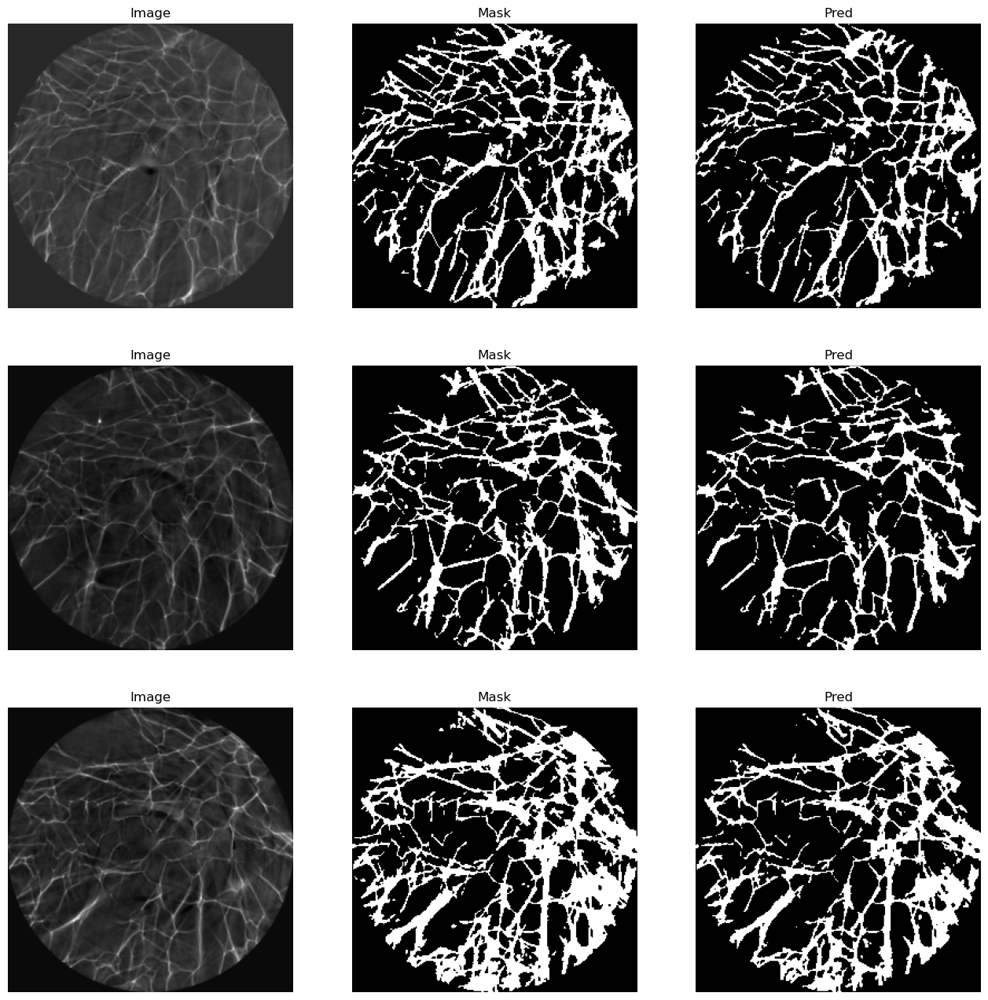

In [26]:
fig, axes = plt.subplots(3,3, figsize=(16,16))
for i in range(3):
    axes[i,0].imshow(imgs[i,0], cmap="gray"); axes[i,0].set_title("Image"); axes[i,0].axis("off")
    axes[i,1].imshow(masks[i,0], cmap="gray"); axes[i,1].set_title("Mask"); axes[i,1].axis("off")
    axes[i,2].imshow(preds[i,0], cmap="gray"); axes[i,2].set_title("Pred"); axes[i,2].axis("off")

fig.savefig("teste_CNN_maior", bbox_inches='tight', dpi = 300)
plt.show()

In [27]:
TP = ((preds == 1) & (masks == 1)).sum().item()
TN = ((preds == 0) & (masks == 0)).sum().item()
FP = ((preds == 1) & (masks == 0)).sum().item()
FN = ((preds == 0) & (masks == 1)).sum().item()
accuracy = (preds == masks).float().mean().item()
print("Acurácia:", accuracy)

precision = TP / (TP + FP + 1e-8)
recall = TP / (TP + FN + 1e-8)
f1_score = 2 * (precision * recall) / (precision + recall + 1e-8)

print(f"Precisão: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1_score:.4f}")

Acurácia: 0.9529647827148438
Precisão: 0.9972
Recall: 0.8078
F1-score: 0.8926
